<h2>2<sup>η</sup> ΕΡΓΑΣΤΗΡΙΑΚΗ ΑΣΚΗΣΗ</h2>
<h3>Ανάλυση Κοινωνικής Δομής σε Τεχνητές και Πραγματικές Σύνθετες Τοπολογίες Δικτύων</h3>
<p style=text-align:justify>Στην παρούσα άσκηση θα αναλυθούν τεχνητές και πραγματικές τοπολογίες σύνθετων δικτύων με βάση τις μετρικές που χρησιμοποιήθηκαν στην προηγούμενη άσκηση και κάποιες τεχνικές που έχουν ως στόχο την εύρεση κοινωνικής δομής. Συγκεκριμένα, θα χρησιμοποιηθούν και θα συγκριθούν διάφοροι αλγόριθμοι εντοπισμού κοινοτήτων σε γράφους δικτύων που προκύπτουν από πραγματικά δεδομένα καθώς και στους συνθετικούς γράφους της πρώτης εργαστηριακής άσκησης.</p>

In [1]:
%matplotlib inline

import matplotlib
import networkx as nx
import random
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
from sklearn.cluster import SpectralClustering

<h3>Α. Μελέτη πραγματικών τοπολογιών</h3>
<p style=text-align:justify>Στο παρόν ερώτημα θα μελετήσετε και θα αποκτήσετε αίσθηση της τοπολογικής δομής πραγματικών δικτύων. Πιο συγκεκριμένα, για τις τοπολογίες που φαίνονται στον <b>πίνακα 1</b>, να βρεθούν και να δειχθούν:</p>
<ol>
    <li>Η κατανομή του βαθμού κόμβου και ο μέσος βαθμός κάθε τοπολογίας.</li>
    <li>Η κατανομή του συντελεστή ομαδοποίησης κόμβου και ο μέσος συντελεστής ομαδοποίησης κάθε τοπολογίας.</li>
    <li>Η κατανομή της κεντρικότητας εγγύτητας και η μέση κεντρικότητα εγγύτητας κάθε τοπολογίας.</li>
</ol>
<p style=text-align:justify>Να συγκριθούν τα αποτελέσματα σε σχέση με αυτά των συνθετικών τοπολογιών. Να χαρακτηρίσετε τον τύπο κάθε μίας από τις πραγματικές τοπολογίες με βάση τους τύπους δικτύων που εξετάστηκαν στην πρώτη εργαστηριακή άσκηση.</p>

<table style=width:100%>
    <caption>Πίνακας <b>1</b>: Πραγματικές τοπολογίες</a></caption>
<tr>
    <th style=text-align:left>Τοπολογία</th>
    <th style=text-align:left>Αρχείο</th>
    <th style=text-align:left>Περιγραφή</th>
</tr>
<tr>
    <td style=text-align:left>American College Football</td>
    <td style=text-align:left><a style=text-decoration:none href='http://www-personal.umich.edu/~mejn/netdata/football.zip'>football.gml</a></td>
    <td style=text-align:left><p style=text-align:justify> The file <b>football.gml</b> contains the network of American football games between Division IA colleges during regular season Fall 2000, as compiled by M. Girvan and M. Newman. The nodes have values that indicate to which conferences they belong.</p>
    </td>
</tr>  
<tr>
    <td style=text-align:left>Game of Thrones - season 5</td>
    <td style=text-align:left><a style=text-decoration:none href='https://networkofthrones.wordpress.com/the-series/season-5/'>GoT</a></td>
    <td style=text-align:left><p style=text-align:justify> The season 5 <b>GoT</b> network represents the interactions between the characters of Game of Thrones in season 5. The season 5 network has 118 nodes (characters) and 394 weighted edges, corresponding to 5,139 interactions. Data can be found here: <a style=text-decoration:none href='https://raw.githubusercontent.com/mathbeveridge/gameofthrones/master/data/got-s5-edges.csv'>GoT_data</a></p>
</tr> 
<tr>
    <td style=text-align:left>email-Eu-core</td>
    <td style=text-align:left><a style=text-decoration:none href='https://snap.stanford.edu/data/email-Eu-core.html'>email-eu-core</a></td>
    <td style=text-align:left><p style=text-align:justify> The network <b>email-Eu-core</b> was generated using email data from a large European research institution. There is an edge (u, v) in the network if person u sent person v at least one email. The e-mails only represent communication between institution members (the core) and the dataset does not contain incoming messages from or outgoing messages to the rest of the world. The dataset also contains "ground-truth" community memberships of the nodes. Each individual belongs to exactly one of 42 departments at the research institute. </p>
</tr> 
    
</table>

<h4>Παραγωγή συνθετικών τοπολογιών</h4> 
<p>Προσοχή! Τα δίκτυα που θα παράξετε θα πρέπει να είναι συνδεδεμένα.</p>

In [2]:
n=80
d=4
M=300
R=0.25
p=0.3
k=4
seedno=5
random.seed(seedno)

REG: nx.Graph = nx.watts_strogatz_graph(n, d, p=0)  # probability of replacing ring nodes is zero
REG.graph['name'] = 'REG'
RGER: nx.Graph = nx.gnm_random_graph(n, M) # regualar graph
RGER.graph['name'] = 'RGER'
RGG: nx.Graph = nx.random_geometric_graph(n, R)  # 2 nodes joined by an edge if distance is at most radius R
RGG.graph['name'] = 'RGG'
SF: nx.Graph = nx.barabasi_albert_graph(n, d) # new nodes each with d edges preferntially attached to existing nodes with high degree
SF.graph['name'] = 'SF'
SW: nx.Graph = nx.watts_strogatz_graph(n, d, p)  # ring of n nodes initially. Each node then joined to its d nearest neighbors
# then, some edges are replaced with probability p with new ones with the ending node chosen uniformly at random  
SW.graph['name'] = 'SW'


In [3]:
synthetic_graphs: dict[str, nx.Graph] = {
    "REG": REG,
    "RGER": RGER,
    "RGG": RGG,
    "SF": SF,
    "SW": SW
}

print("Graph\tNodes\tEdges")
for g_name, graph in synthetic_graphs.items():
    print(f"{g_name}\t{graph.number_of_nodes()}\t{graph.number_of_edges()}")

Graph	Nodes	Edges
REG	80	160
RGER	80	300
RGG	80	560
SF	80	304
SW	80	160


In [4]:
# check if networks generated are connnected

print('Graph\t\tConnected')
for g_name, graph in synthetic_graphs.items():
    print(f"{g_name}\t\t{nx.is_connected(graph)}")

Graph		Connected
REG		True
RGER		True
RGG		True
SF		True
SW		True


We have found out that all the examined topologies are connected graphs.

<h4>Εισαγωγή και οπτικοποίηση πραγματικών τοπολογιών.</h4>

In [5]:
#football network
football: nx.Graph = nx.read_gml(r"football.gml")
football.graph['name'] = 'Football'

In [6]:
#Game of thrones network
import csv
got: nx.Graph = nx.Graph()
got.graph['name'] = 'GOT'
with open('got_s5.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    line_count = 0
    next(csv_reader)
    for row in csv_reader:
        got.add_edge(row[0],row[1])
        line_count += 1

#### Προσοχή! Θα μελετήσετε τη μεγαλύτερη συνδεδεμένη συνιστώσα του δικτύου email-Eu-core, αφού πρώτα αφαιρέσετε τα self-loops. Μπορείτε να κάνετε χρήση των συναρτήσεων connected_components, subgraph, remove_edges_from του networkx.

In [7]:
#email-Eu-core network
eu: nx.DiGraph = nx.read_edgelist("email-Eu-core.txt",create_using=nx.Graph())
eu.graph['name'] = 'Email-EU'

In [8]:
real_graphs: dict[str, nx.Graph] = {
    "fb": football,
    "got": got,
    "eu": eu
    }

print("Graph\tNodes\tEdges")
for g_name, graph in real_graphs.items():
    print(f"{g_name}\t{graph.number_of_nodes()}\t{graph.number_of_edges()}")

Graph	Nodes	Edges
fb	115	613
got	119	396
eu	1005	16706


In [9]:
def find_self_loops(G: nx.Graph) -> list[tuple]:
    iterable = G.edges
    loops = list()
    for edge in G.edges:
        node1, node2 = edge[0], edge[1]
        if node1 == node2:
            loops.append(edge)
    print(f"Graph: {G.graph['name']}\nSelf loops = {len(loops)}")
    return loops

In [10]:
eu_self_loops = find_self_loops(eu)

Graph: Email-EU
Self loops = 642


In [11]:
eu_no_loops: nx.DiGraph = eu.copy()
eu_no_loops.remove_edges_from(ebunch=eu_self_loops)

In [12]:
print(f"Graph: {eu.graph['name']}")
print(f"Initial graph edges = {len(eu.edges)}")
print(f"Self loops = {len(eu_self_loops)}")
print(f"Edges after removing self loops = {len(eu_no_loops.edges)}")

Graph: Email-EU
Initial graph edges = 16706
Self loops = 642
Edges after removing self loops = 16064


In [13]:
con_components = sorted(nx.connected_components(eu_no_loops), key=len, reverse=True)

eu_no_loops_largest_con_component_set: set = con_components[0]
eu2: nx.DiGraph = eu_no_loops.subgraph(eu_no_loops_largest_con_component_set) # graph of the largest component of eu without any loops 
eu2.graph['name'] = f"{eu.graph['name']} no-loops largest component"
print(f"{eu2.graph['name']} has {eu2.number_of_nodes()} nodes and {eu2.number_of_edges()} edges.")

Email-EU no-loops largest component has 986 nodes and 16064 edges.


In [14]:
real_graphs: dict[str, nx.Graph] = {
    "fb": football,
    "got": got,
    "eu2": eu2
    }

print("Graph\tNodes\tEdges")
for g_name, graph in real_graphs.items():
    print(f"{g_name}\t{graph.number_of_nodes()}\t{graph.number_of_edges()}")

Graph	Nodes	Edges
fb	115	613
got	119	396
eu2	986	16064


<h4>Μελέτη βαθμού κόμβου για πραγματικές και συνθετικές τοπολογίες.</h4>

In [15]:
node_styling = {
    "node_color": "midnightblue",
    "edge_color": "blue",
    "node_size": 200
}

def draw_circular_graph(G: nx.Graph, node_styling: dict = node_styling, figsize=(10,10)):
    G_name = G.graph['name']
    fig, ax = plt.subplots(figsize=figsize)
    nx.draw_circular(G, **node_styling, ax=ax)
    ax.axis("equal")
    plt.title(f"Graph: {G_name}")
    plt.show()

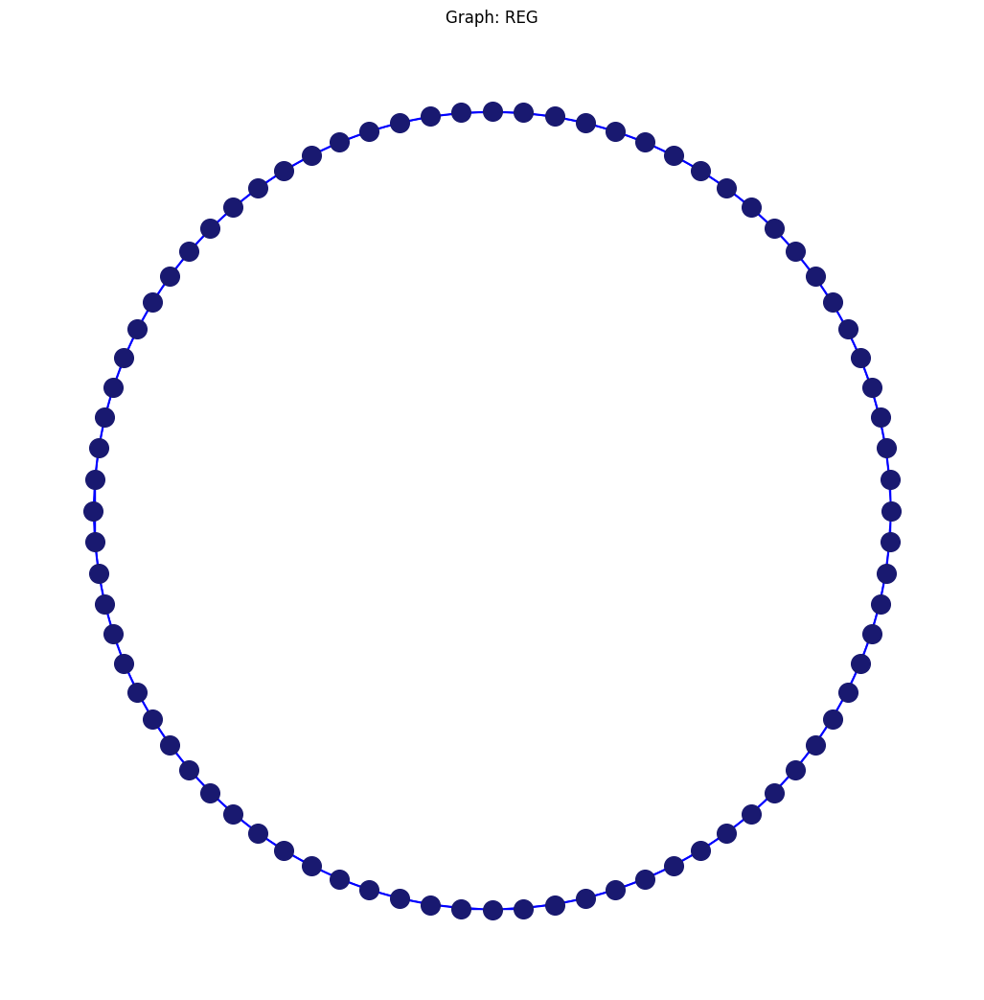

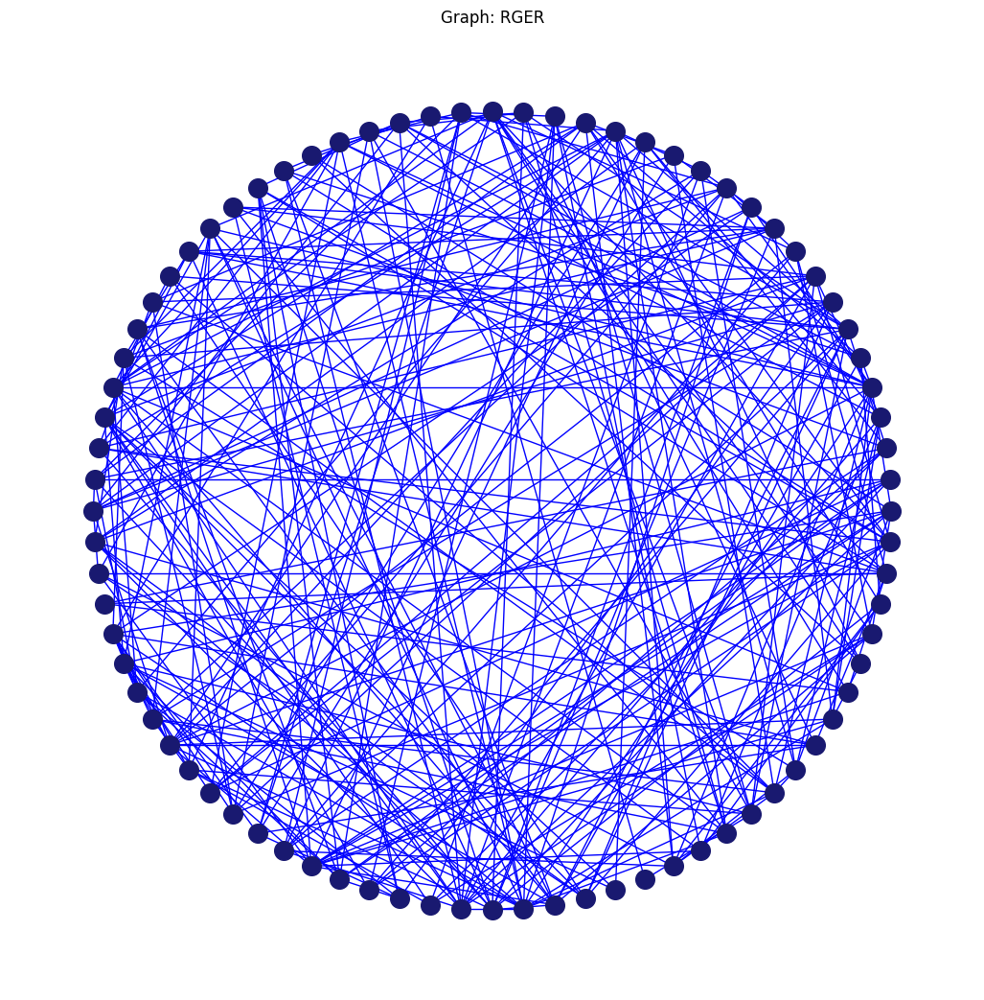

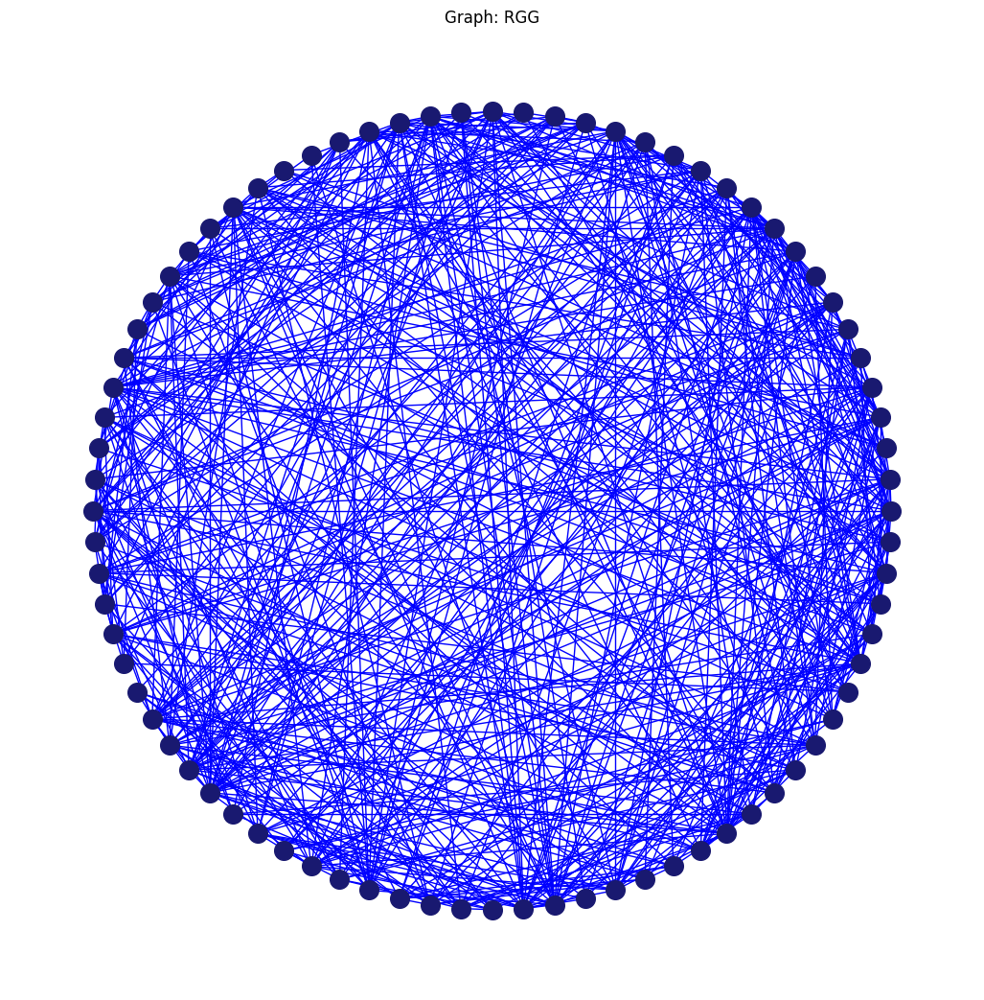

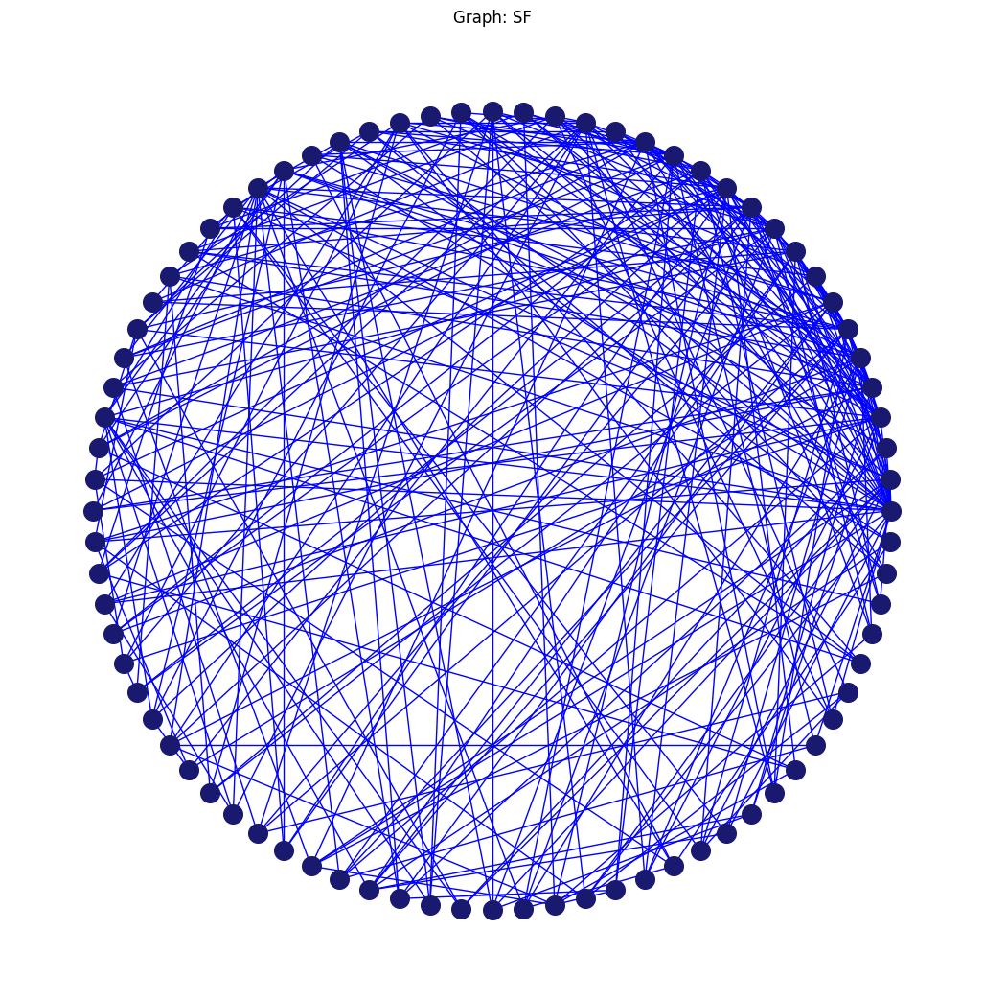

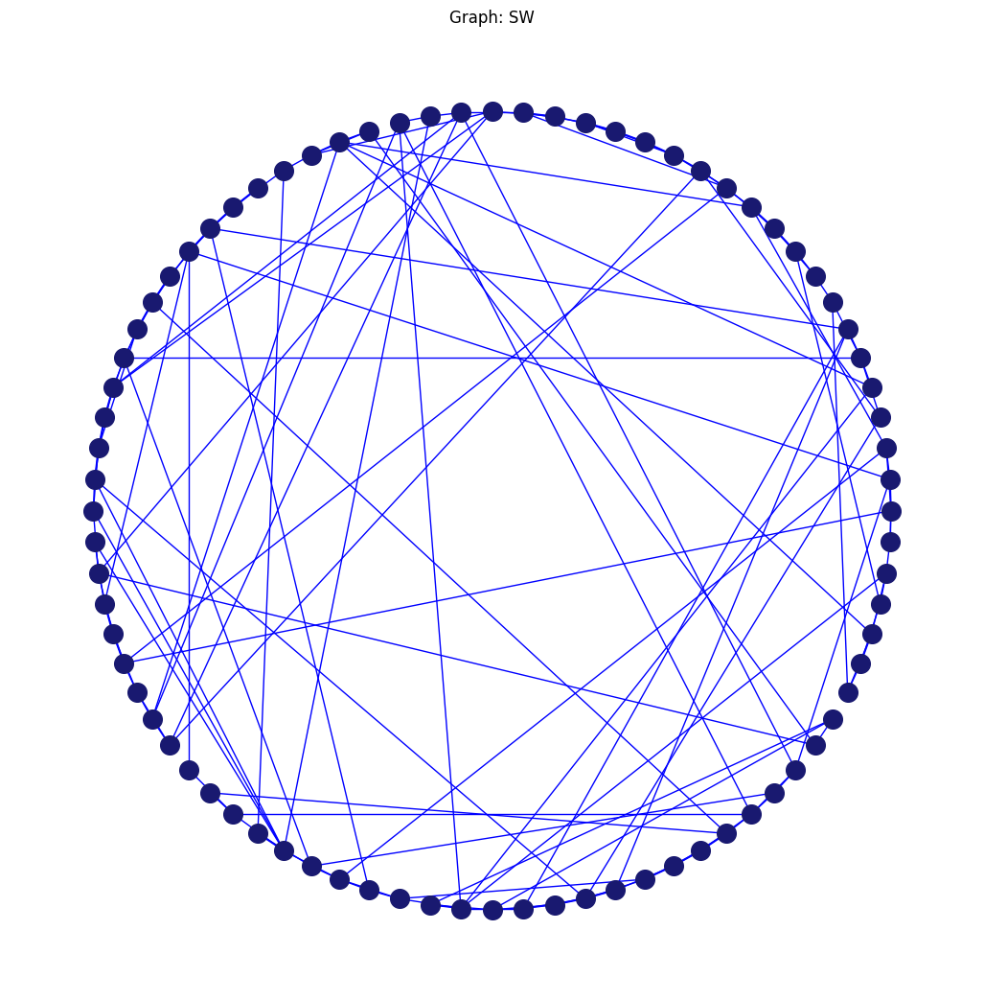

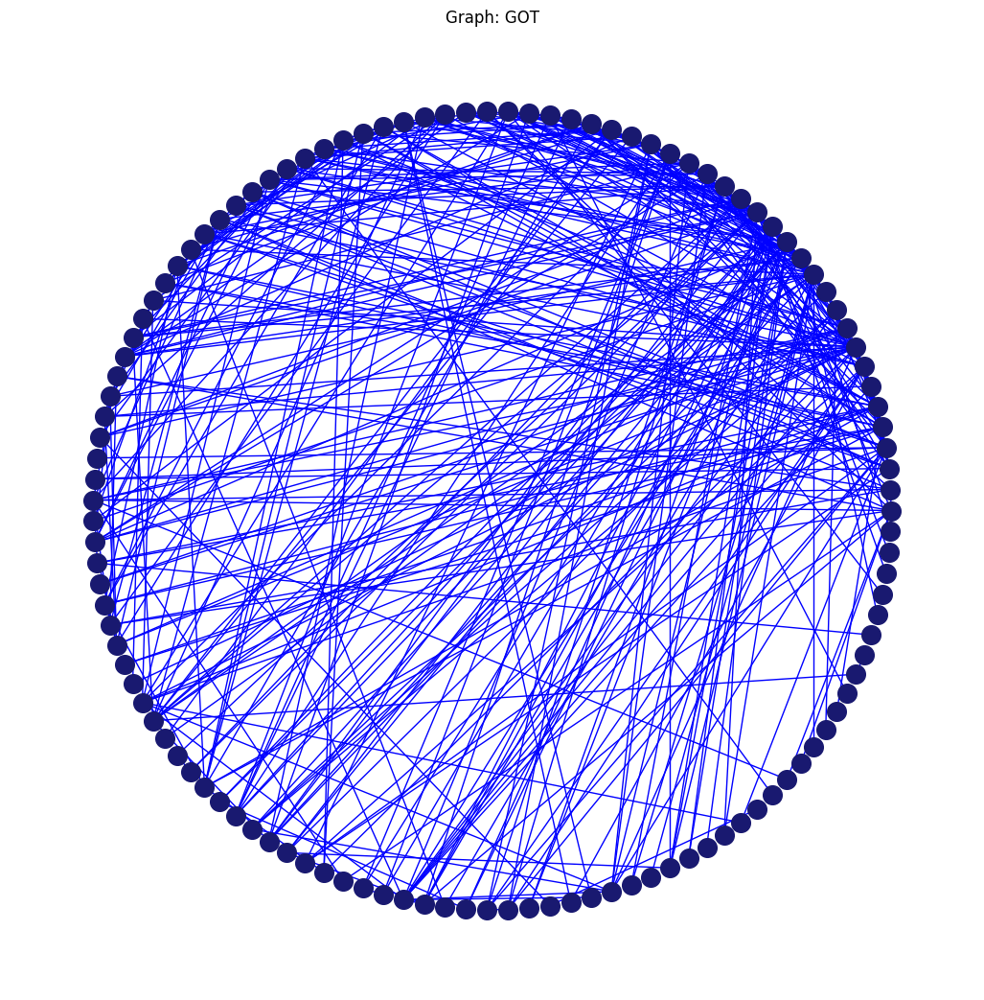

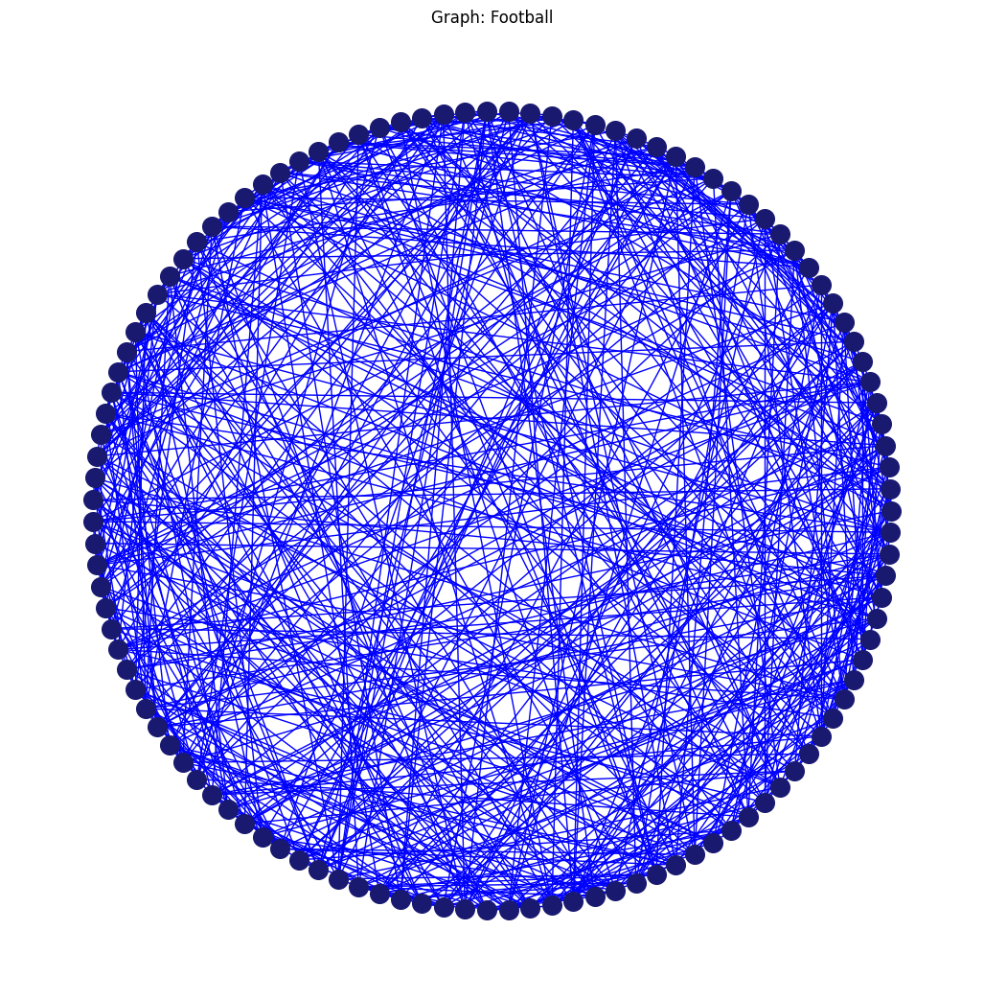

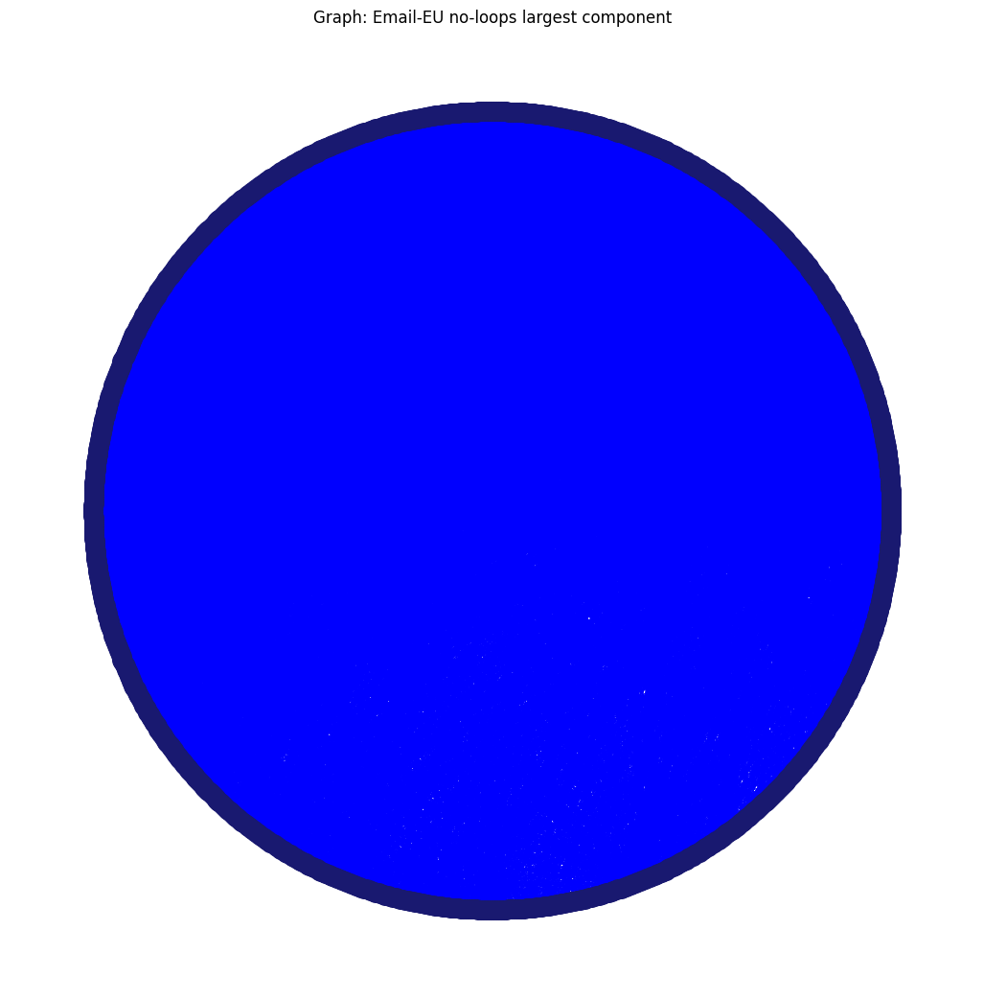

In [16]:
figsize = (13,13)
draw_circular_graph(REG, figsize=figsize)
draw_circular_graph(RGER, figsize=figsize)
draw_circular_graph(RGG, figsize=figsize)
draw_circular_graph(SF, figsize=figsize)
draw_circular_graph(SW, figsize=figsize)
draw_circular_graph(got, figsize=figsize)
draw_circular_graph(football, figsize=figsize)
draw_circular_graph(eu2, figsize=figsize)

Given the large amount of nodes and especially edges for the **Email-EU** graph, we can see that we cannot get a clear picture within the graph shown given the density of nodes and edges.
It's clear, however, that the **GOT** graph looks more like a SF graph, whereas the **Football** graph is unclear whether it looks like an RGG, a SW or none of those - given the density of the graph we cannot really tell for sure.

In [17]:
def find_degree(G: nx.Graph, n_bins='auto', verbose=True, hist=True, shared_hist=False):
    """
    Default mode is verbose=True, hist=True that prints information on the node degrees of the graph
    and also returns them along with a histogram.
    The 2nd mode is the shared_hist=True where nothing is returned and a common histogram plot can be created.
    """
    G_name: str = G.graph['name'] # name attribute of the nx.Graph object
    n = nx.number_of_nodes(G) # nodes number

    # histogram of node degree
    node_degrees: list = [G.degree(node) for node in G.nodes]
    nodes_degrees_np: np.array = np.array(node_degrees)
    avg_degree = np.mean(nodes_degrees_np)
    var_degree = np.var(nodes_degrees_np)

    # prints
    if verbose:
        print(f"Graph: {G_name}")  # show name of graph
        print(f"Average node degree = {avg_degree:.3f}, variance = {var_degree:.3f}")

    if hist:
        plt.hist(node_degrees, bins=n_bins, label=G_name, alpha=0.8) # histogram of local node degree. Binning strategy 'auto' is the max of 'sturges' and 'fd' estimators providing good all around performance.
        plt.title(f"Node degree distribution histogram")
        plt.xlabel("Node degree")
        plt.ylabel("Number of nodes (absolute frequency)")
    
    if not shared_hist: # if in shared hist mode just create the shared histogram and don't return something
        plt.title(f"{G_name} node degree distribution histogram")
        return hist

Graph: REG
Average node degree = 4.000, variance = 0.000


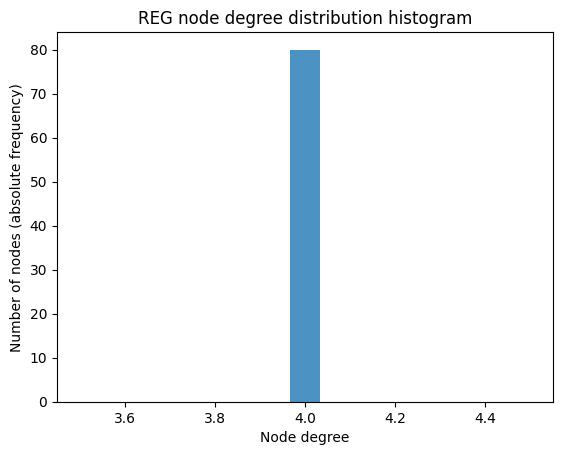

Graph: RGER
Average node degree = 7.500, variance = 7.025


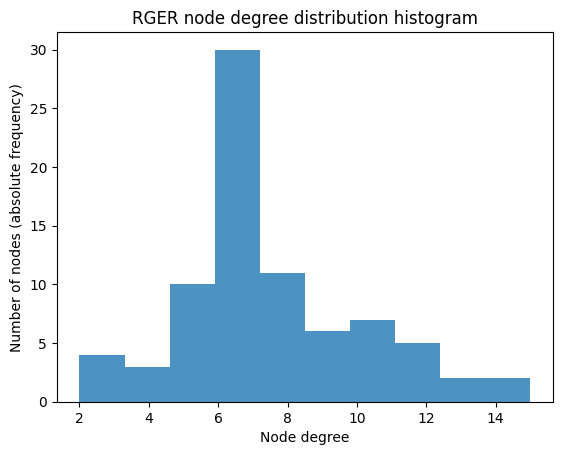

Graph: RGG
Average node degree = 14.000, variance = 30.250


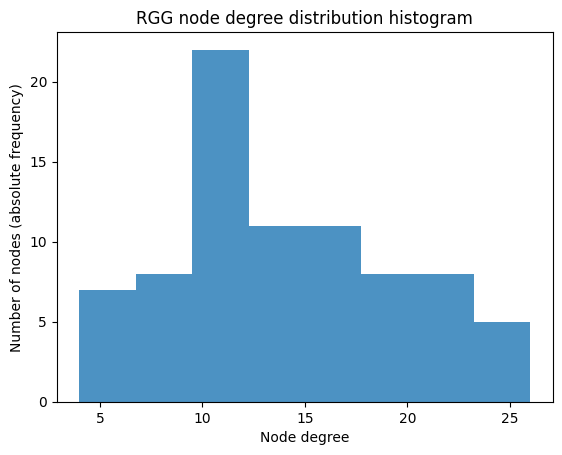

Graph: SF
Average node degree = 7.600, variance = 23.340


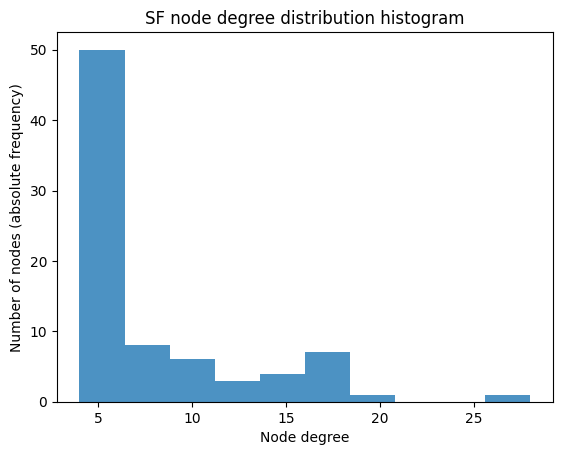

Graph: SW
Average node degree = 4.000, variance = 1.025


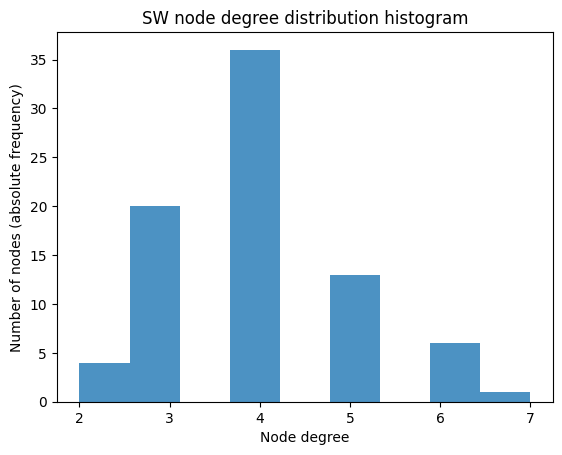

Graph: GOT
Average node degree = 6.655, variance = 31.049


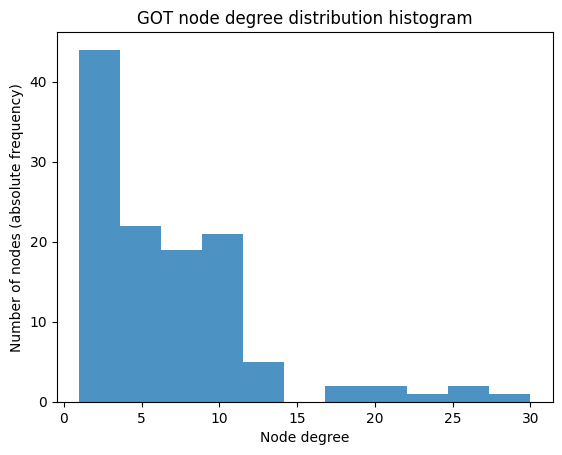

Graph: Football
Average node degree = 10.661, variance = 0.781


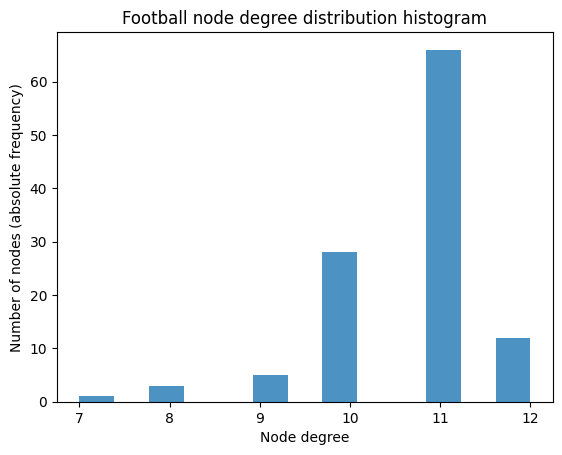

Graph: Email-EU no-loops largest component
Average node degree = 32.584, variance = 1370.888


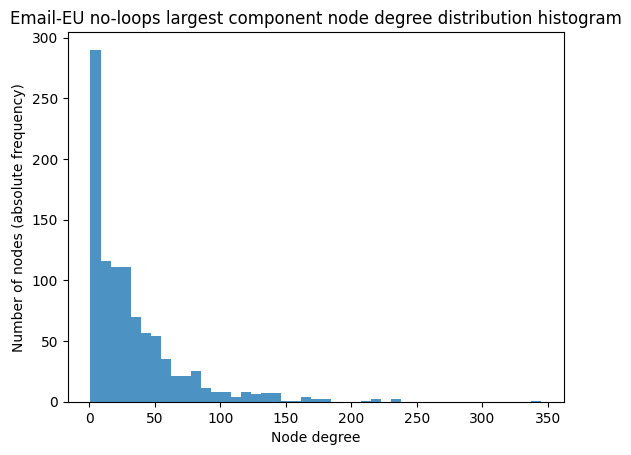

In [18]:
graphs: tuple[nx.Graph] = (REG, RGER, RGG, SF, SW, got, football, eu2)
graphs_names: list[str] = (G.graph['name'] for G in graphs)

for graph in graphs:
    plt.figure()
    if graph == REG:
        histogram_plot = find_degree(graph, n_bins=15) # for the REG graph use 15 bins instead of automatically defining them, otherwise a single bin is used by the 'auto' option set as default value in the function
    else:
        histogram_plot = find_degree(graph)
    plt.show()

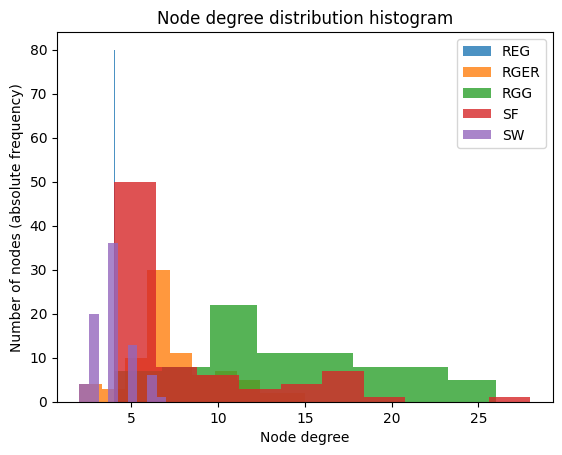

In [19]:
graphs: tuple[nx.Graph] = (REG, RGER, RGG, SF, SW)
graphs_names: list[str] = (G.graph['name'] for G in graphs)

for graph in graphs:
    if graph == REG:
        find_degree(graph, n_bins=15, verbose=False, shared_hist=True) # for the REG graph use 15 bins instead of automatically defining them, otherwise a single bin is used by the 'auto' option set as default value in the function
    else:
        find_degree(graph, verbose=False, shared_hist=True)
plt.legend()
plt.show()

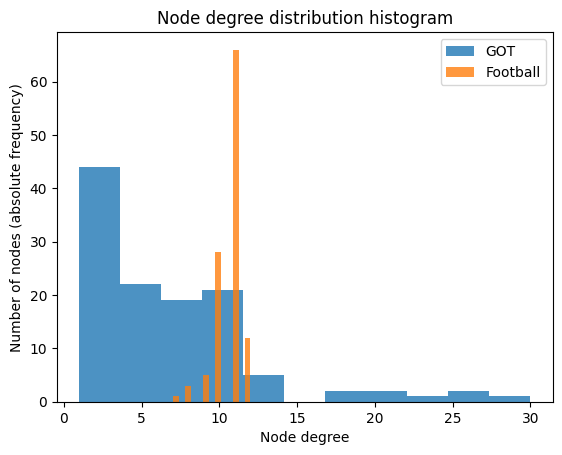

In [20]:
graphs: tuple[nx.Graph] = (got, football)
graphs_names: list[str] = (G.graph['name'] for G in graphs)

for graph in graphs:
    find_degree(graph, verbose=False, shared_hist=True)
plt.legend()
plt.show()

For the different real and synthetic topologies and their node degree distribution histograms above, we can conlude that:
- GOT, Game of Thrones graph is SF, it has a relatively low average node degree value with its variance being several times larger thatn the average and its distribution form being similar to that of a power law graph
- The Email-EU (no loops - largest component) graph is SF too exhibiting the same attributes for its average node degree and variance as well as its distribution graph form
- Football graph could only be similar to SW although with some doubt. It has a relatively low average node degree with even lower variance and starts to look like a normal distribution, i.e. converging towards an RGER

<h4>Μελέτη συντελεστή ομαδοποίησης για πραγματικές και συνθετικές τοπολογίες</h4>

In [21]:
def cc(G: nx.Graph, n_bins='auto', verbose=True, hist=True, shared_hist=False):
    """
    Default mode is verbose=True, hist=True that prints information on the clustering coefficients of the graph
    and also returns them along with a histogram.
    The 2nd mode is the shared_hist=True where nothing is returned and a common histogram plot can be created.
    """
    G_name: str = G.graph['name'] # name attribute of the nx.Graph object
    local_cc: dict = nx.clustering(G) # calculate local clustering coefficients for all graph nodes
    n = nx.number_of_nodes(G) # nodes number

    # histogram of node (local) clustering coefficients
    cc_dist: np.ndarray = np.array(list(local_cc.values()))

    # mean cc and variance
    mean_cc: float = np.mean(cc_dist)
    variance_cc: float = np.var(cc_dist)

    # nodes with min and max cc
    max_cc: float = np.max(cc_dist) # maximum cc value
    max_cc_index: int = np.argmax(cc_dist)  # index of node with maximum cc value

    min_cc: float = np.min(cc_dist)
    min_cc_index: int = np.argmin(cc_dist) 

    # prints
    if verbose:
        print(f"Graph: {G_name}")  # show name of graph
        print(f"Clustering coefficient: mean = {mean_cc:.3f}, variance = {variance_cc:.3f}")
        print(f"Maximum clustering coefficient node index = {max_cc_index}, value = {max_cc:.3f}")
        print(f"Minimum clustering coefficient node index = {min_cc_index}, value = {min_cc:.3f}")

    if hist:
        plt.hist(cc_dist, bins=n_bins, label=G_name, alpha=0.8) # histogram of local node cc. Binning strategy 'auto' is the max of 'sturges' and 'fd' estimators providing good all around performance.
        plt.title(f"Local clustering coefficients' histogram")
        plt.xlabel("Clustering coefficient value")
        plt.ylabel("Number of nodes (absolute frequency)")
    
    if not shared_hist: # if in shared hist mode just create the shared histogram and don't return something
        plt.title(f"{G_name} local clustering coefficients' histogram")

        return hist, cc_dist, mean_cc, variance_cc, max_cc, max_cc_index, min_cc, min_cc_index

Graph: REG
Clustering coefficient: mean = 0.500, variance = 0.000
Maximum clustering coefficient node index = 0, value = 0.500
Minimum clustering coefficient node index = 0, value = 0.500


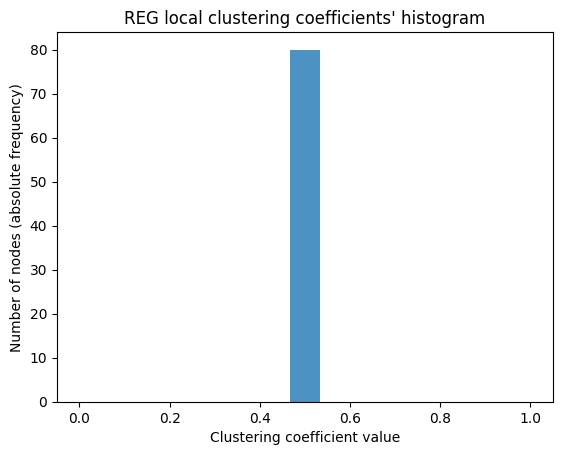

Graph: RGER
Clustering coefficient: mean = 0.108, variance = 0.006
Maximum clustering coefficient node index = 43, value = 0.333
Minimum clustering coefficient node index = 14, value = 0.000


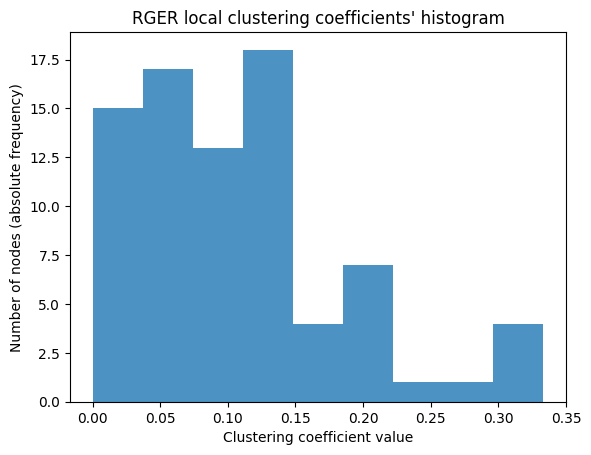

Graph: RGG
Clustering coefficient: mean = 0.689, variance = 0.020
Maximum clustering coefficient node index = 26, value = 1.000
Minimum clustering coefficient node index = 70, value = 0.462


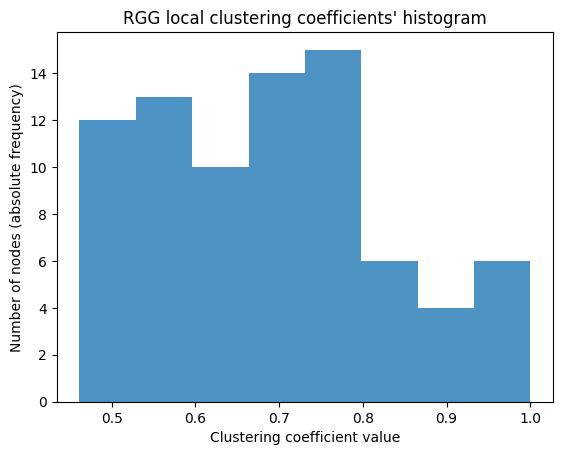

Graph: SF
Clustering coefficient: mean = 0.154, variance = 0.012
Maximum clustering coefficient node index = 16, value = 0.600
Minimum clustering coefficient node index = 38, value = 0.000


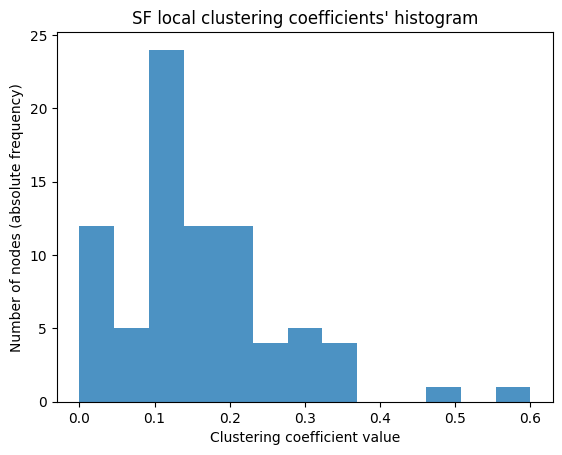

Graph: SW
Clustering coefficient: mean = 0.194, variance = 0.040
Maximum clustering coefficient node index = 15, value = 1.000
Minimum clustering coefficient node index = 3, value = 0.000


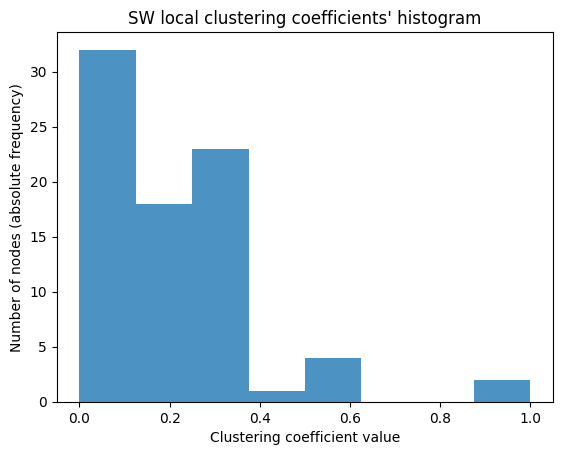

Graph: GOT
Clustering coefficient: mean = 0.574, variance = 0.126
Maximum clustering coefficient node index = 26, value = 1.000
Minimum clustering coefficient node index = 57, value = 0.000


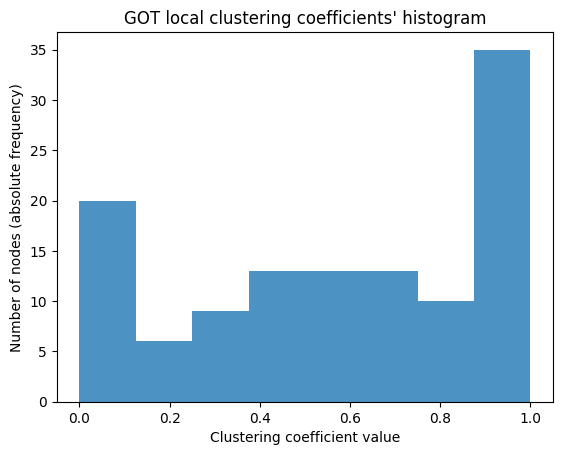

Graph: Football
Clustering coefficient: mean = 0.403, variance = 0.011
Maximum clustering coefficient node index = 105, value = 0.667
Minimum clustering coefficient node index = 58, value = 0.111


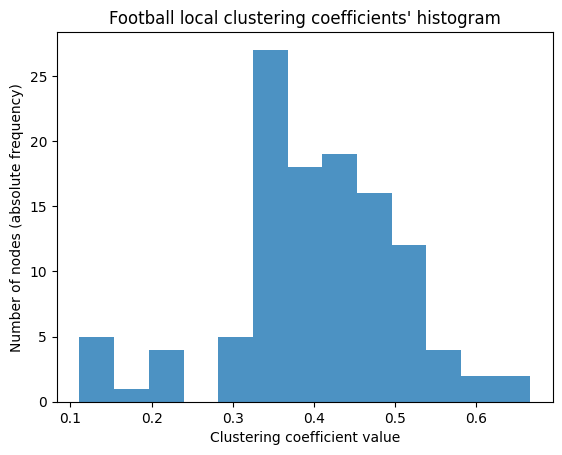

Graph: Email-EU no-loops largest component
Clustering coefficient: mean = 0.407, variance = 0.061
Maximum clustering coefficient node index = 348, value = 1.000
Minimum clustering coefficient node index = 449, value = 0.000


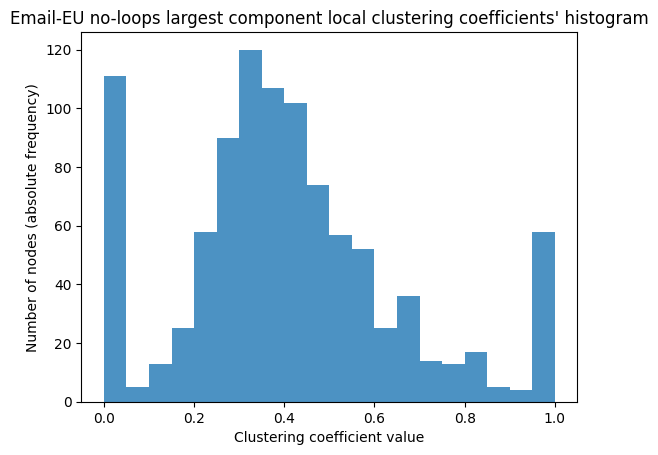

In [22]:
graphs: tuple[nx.Graph] = (REG, RGER, RGG, SF, SW, got, football, eu2)
graphs_names: list[str] = (G.graph['name'] for G in graphs)

for graph in graphs:
    plt.figure()
    if graph == REG:
        histogram_plot, *_ = cc(graph, n_bins=15) # for the REG graph use 15 bins instead of automatically defining them, otherwise a single bin is used by the 'auto' option set as default value in the function
    else:
        histogram_plot, *_  = cc(graph)
    plt.show()

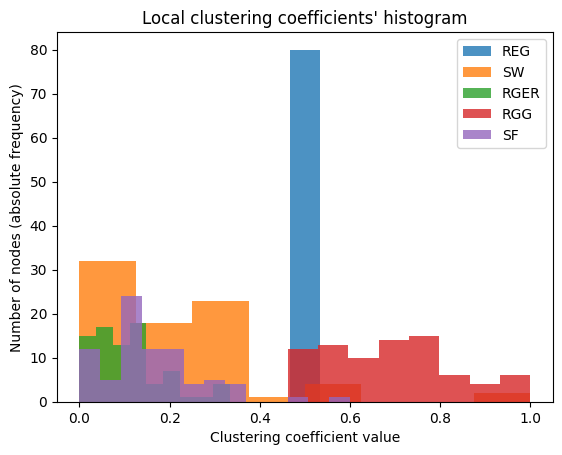

In [23]:
graphs: tuple[nx.Graph] = (REG, SW, RGER, RGG, SF)
graphs_names: list[str] = (G.graph['name'] for G in graphs)

for graph in graphs:
    if graph == REG:
        cc(graph, n_bins=15, verbose=False, shared_hist=True) # for the REG graph use 15 bins instead of automatically defining them, otherwise a single bin is used by the 'auto' option set as default value in the function
    else:
        cc(graph, verbose=False, shared_hist=True)
plt.legend()
plt.show()    


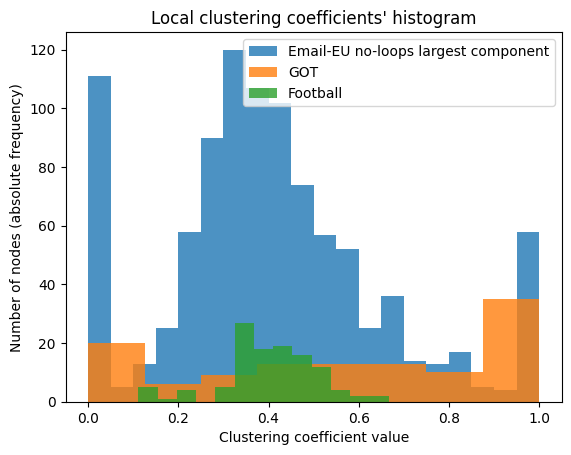

In [24]:
graphs: tuple[nx.Graph] = (eu2, got, football)
graphs_names: list[str] = (G.graph['name'] for G in graphs)

for graph in graphs:
    cc(graph, verbose=False, shared_hist=True)
plt.legend()
plt.show()    


<h4>Μελέτη κεντρικότητας εγγύτητας για πραγματικές και συνθετικές τοπολογίες </h4>

In [25]:
def find_closeness(G: nx.Graph, n_bins='auto', verbose=True, hist=True, shared_hist=False):
    """
    Default mode is verbose=True, hist=True that prints information on the closeness centrality of the graph
    and also returns them along with a histogram.
    The 2nd mode is the shared_hist=True where nothing is returned and a common histogram plot can be created.
    """
    G_name: str = G.graph['name'] # name attribute of the nx.Graph object
    n = nx.number_of_nodes(G) # nodes number

    closeness_dict: dict = nx.closeness_centrality(G)
    closeness: np.array = np.array(list(closeness_dict.values()))

    # histogram of node (local) closeness
    avg_closeness = np.mean(closeness)
    var_closeness = np.var(closeness)

    # prints
    if verbose:
        print(f"Graph: {G_name}")  # show name of graph
        print(f"Average closeness centrality = {avg_closeness:.3f}, variance = {var_closeness:.3f}")

    if hist:
        plt.hist(closeness, bins=n_bins, label=G_name, alpha=0.8) # histogram of local node cc. Binning strategy 'auto' is the max of 'sturges' and 'fd' estimators providing good all around performance.
        plt.title('Node closeness centrality histogram')
        plt.xlabel("Node closeness centrality")
        plt.ylabel("Number of nodes (absolute frequency)")
    
    if not shared_hist: # if in shared hist mode just create the shared histogram and don't return something
        plt.title(f"{G_name} node closeness centrality histogram")
        return hist


Graph: REG
Average closeness centrality = 0.096, variance = 0.000


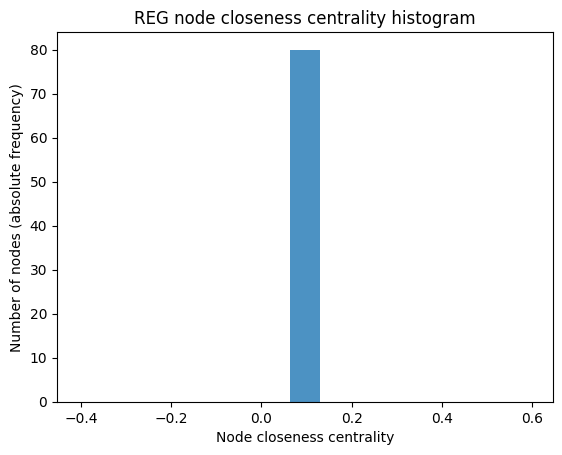

Graph: RGER
Average closeness centrality = 0.425, variance = 0.001


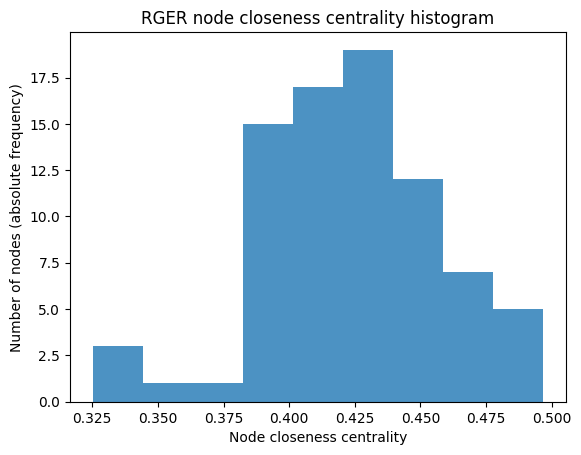

Graph: RGG
Average closeness centrality = 0.364, variance = 0.003


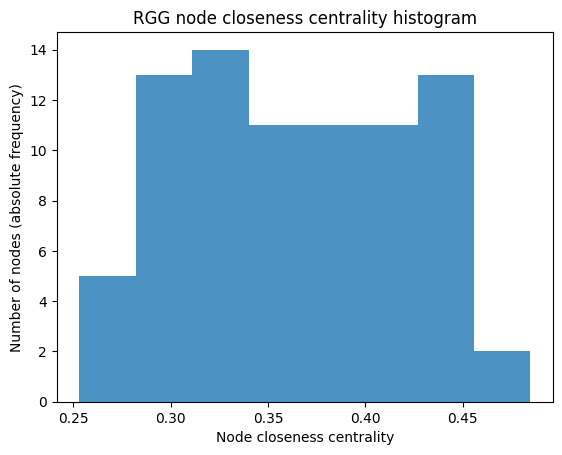

Graph: SF
Average closeness centrality = 0.439, variance = 0.002


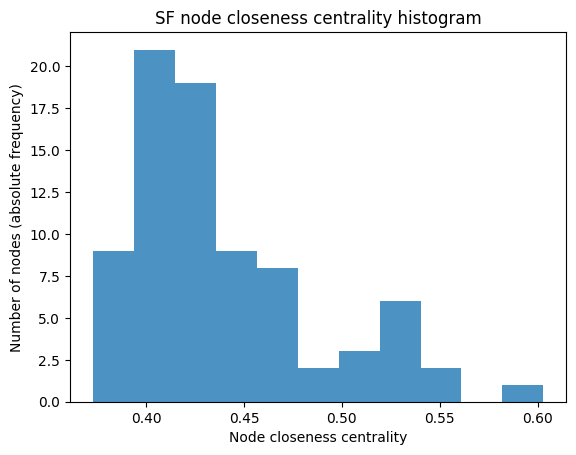

Graph: SW
Average closeness centrality = 0.279, variance = 0.001


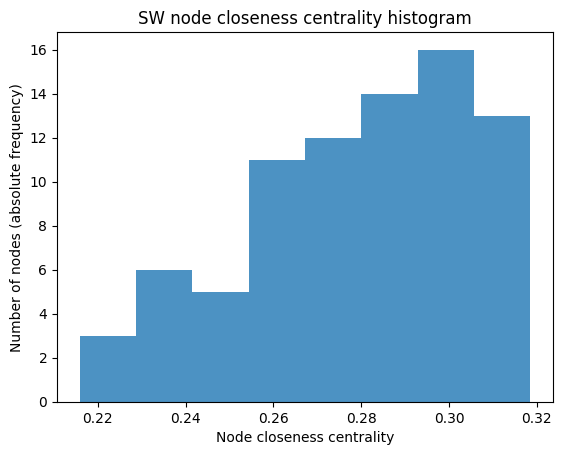

Graph: GOT
Average closeness centrality = 0.319, variance = 0.003


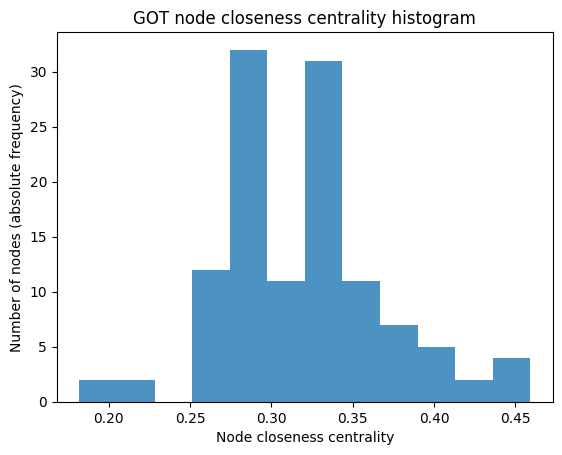

Graph: Football
Average closeness centrality = 0.399, variance = 0.000


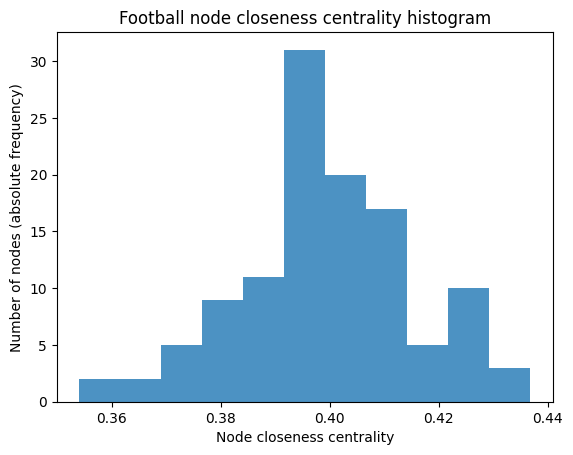

Graph: Email-EU no-loops largest component
Average closeness centrality = 0.394, variance = 0.003


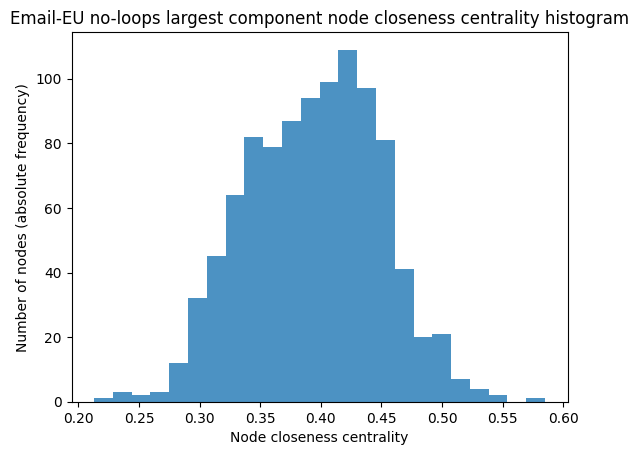

In [26]:
graphs: tuple[nx.Graph] = (REG, RGER, RGG, SF, SW, got, football, eu2)
graphs_names: list[str] = (G.graph['name'] for G in graphs)

for graph in graphs:
    plt.figure()
    if graph == REG:
        histogram_plot = find_closeness(graph, n_bins=15) # for the REG graph use 15 bins instead of automatically defining them, otherwise a single bin is used by the 'auto' option set as default value in the function
    else:
        histogram_plot = find_closeness(graph)
    plt.show()

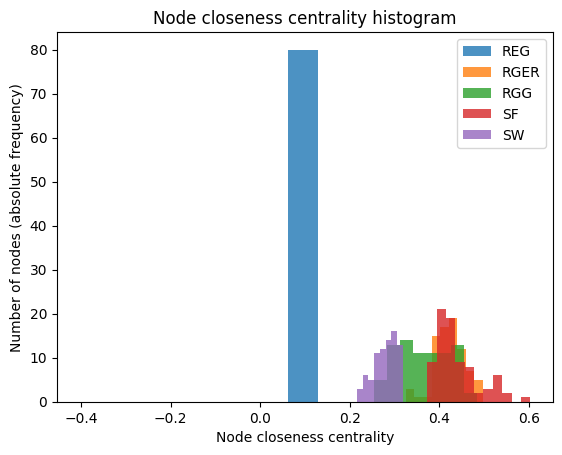

In [27]:
graphs: tuple[nx.Graph] = (REG, RGER, RGG, SF, SW)
graphs_names: list[str] = (G.graph['name'] for G in graphs)

for graph in graphs:
    if graph == REG:
        find_closeness(graph, n_bins=15, verbose=False, shared_hist=True) # for the REG graph use 15 bins instead of automatically defining them, otherwise a single bin is used by the 'auto' option set as default value in the function
    else:
        find_closeness(graph, verbose=False, shared_hist=True)
plt.legend()
plt.show()

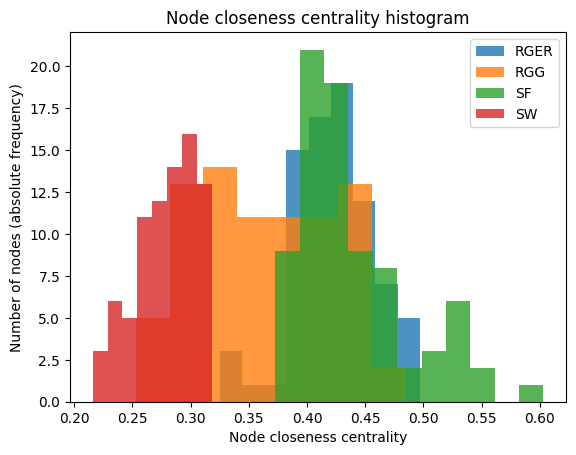

In [28]:
# exclude REG in the plot so that the other graphs' distributions can be more visible

graphs: tuple[nx.Graph] = (RGER, RGG, SF, SW)
graphs_names: list[str] = (G.graph['name'] for G in graphs)

for graph in graphs:
    find_closeness(graph, verbose=False, shared_hist=True)
plt.legend()
plt.show()

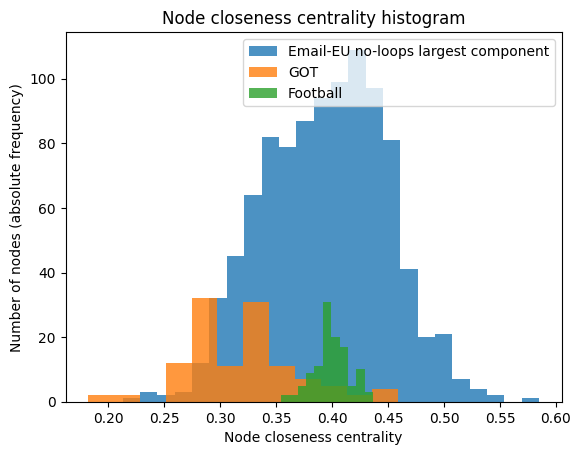

In [29]:
graphs: tuple[nx.Graph] = (eu2, got, football)
graphs_names: list[str] = (G.graph['name'] for G in graphs)

for graph in graphs:
    if graph == REG:
        find_closeness(graph, n_bins=15, verbose=False, shared_hist=True) # for the REG graph use 15 bins instead of automatically defining them, otherwise a single bin is used by the 'auto' option set as default value in the function
    else:
        find_closeness(graph, verbose=False, shared_hist=True)
plt.legend()
plt.show()

Based on the closenss centrality distribution histograms, we can see that the Footbal network is more alike the RGER network rather than the SW which is centered to a lower closeness centrality.

<h3>B. Εξοικείωση με τα εργαλεία εντοπισμού κοινοτήτων</h3>
<ol>
<li>Χρησιμοποιώντας τις συναρτήσεις του <b>πίνακα 2</b> για κάθε <u>πραγματικό</u> (<b>πίνακας 1</b>) και <u>συνθετικό</u> (από την <b>άσκηση 1</b>) δίκτυο:</p>
<ol>
    <li>να οπτικοποιηθούν οι κοινότητες που προκύπτουν από την κάθε μέθοδο,</li>
    <li>να γίνουν οι απαραίτητοι σχολιασμοί (π.χ: σύγκριση του αριθμού των κοινοτήτων που υπολογίζει ο κάθε αλγόριθμος).</li>
</ol>
<p>Για την οπτικοποίηση, να επισημανθεί διαφορετικά κάθε κοινότητα, π.χ. με διαφορετικό χρώμα.</p>
<p style=text-align:justify>Στην περίπτωση των συνθετικών δικτύων, να πραγματοποιηθούν συγκρίσεις και μεταξύ των διαφορετικών τύπων τοπολογιών. Για παράδειγμα, στην περίπτωση του τυχαίου γεωμετρικού γράφου, υπάρχει διαισθητικά μία κοινότητα γύρω από κάθε κόμβο που δημιουργείται με βάση τις αποστάσεις του τελευταίου από τους υπόλοιπους κόμβους του δικτύου. Στην περίπτωση των scale-free δικτύων, είναι πιθανό να σχηματίζονται κοινότητες γύρω από τους κόμβους με μεγάλο βαθμό.</p>
<li>Για κάθε αλγόριθμο εντοπισμού κοινοτήτων και για κάθε τοπολογία αξιολογήστε την ποιότητα της διαμέρισης με τις μετρικές performance και modularity (<a style=text-decoration:none href='https://networkx.org/documentation/stable/reference/algorithms/community.html#module-networkx.algorithms.community.quality'>measuring_partitions</a>). Για την μετρική performance, θα χρησιμοποιήσετε την συνάρτηση partition_quality του networkx.</li>
<li>Για την μεγαλύτερη συνδεδεμένη συνιστώσα του email-Eu-core, να συγκρίνετε την ground-truth διαμέριση που δίνεται στο αρχείο Email-Eu-core-department-labels.txt με τις διαμερίσεις που προκύπτουν από τις εξεταζόμενες μεθόδους ως προς το πλήθος των παραγόμενων κοινοτήτων και ως προς τις μετρικές performance και modularity. </li>
<li>Για την παρακολούθηση του χρόνου εκτέλεσης της υλοποίησής σας, μπορείτε να χρησιμοποιήσετε τις βιωλιοθήκες <a style=text-decoration:none href='https://tqdm.github.io/'>tqdm</a> και <a style=text-decoration:none href='https://docs.python.org/3/library/time.html'>time</a> . Στο σχολιασμό σας να λάβετε υπόψη το trade-off της ποιότητας της διαμέρισης και του χρόνου εκτέλεσης των εξεταζόμενων αλγορίθμων. </li>
</ol>

<table style=float:left;width:70%>
    <caption>Πίνακας <b>2</b>: Συναρτήσεις εντοπισμού κοινοτήτων</caption>
    <tr>
        <th style=text-align:left> Μέθοδος εντοπισμού κοινοτήτων</th>
        <th style=text-align:left>Συνάρτηση</th>
    </tr>
    <tr>
        <td style=text-align:left>Spectral Clustering</td>
        <td style=text-align:left><a style=text-decoration:none href='http://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html'>SpectralClustering</a></td>
    </tr>
       <tr>
        <td style=text-align:left>Newman-Girvan</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.centrality.girvan_newman.html'>girvan_newman</a></td>
    </tr>
    <tr>
        <td style=text-align:left>Modularity Maximization</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.modularity_max.greedy_modularity_communities.html'>greedy_modularity_communities</a></td>
    </tr>
</table>
    

<p style=text-align:justify>Προτού εφαρμόσετε τις συναρτήσεις εντοπισμού κοινοτήτων μελετήστε προσεκτικά την <b>είσοδο που απαιτούν καθώς και τη μορφή εξόδου που παράγουν.</b></p>

In [30]:
#Χρησιμοποιήστε την συνάρτηση conv2int για να μετατρέψετε τα labels των κόμβων στις πραγματικές τοπολογίες σε integers
def conv2int(G: nx.Graph, start_value: int = 0) -> tuple[nx.Graph, dict]:
    nG = nx.convert_node_labels_to_integers(G, first_label=start_value)
    G_mapping = dict(enumerate(G.nodes, start=start_value))
    return nG, G_mapping

<h4> Ορισμός χρωμάτων για την οπτικοποίηση των κοινοτήτων.</h4>

In [31]:
#insert colors for nodes
from matplotlib import colors as mcolors
colors = list(dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS).keys())

<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Newman-Girvan.</h4>
<p>Παράξτε τις διαμερίσεις που προκύπτουν από την μέθοδο Newman-Girvan. Ελέγξτε τις διαμερίσεις που έχουν μέχρι και 50 κοινότητες.</p> 
<p> Επιλέξτε τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>

In [32]:
from networkx.algorithms import community
from typing import Iterator, Tuple
from tqdm.auto import tqdm

def gn_partitions(G: nx.Graph):
    conversion: tuple[nx.Graph, dict]  = conv2int(G) # start value = 0
    G_converted, G_conversion_map = conversion

    G_partitions_generator: Iterator[Tuple[set, ...]] = community.girvan_newman(G_converted)

    communities_found: int = 0
    communities_found_list: list[int] = []
    partitions_list: list[Tuple[set, ...]] = []
    modularity_scores: np.ndarray[float] = np.array([])
    performance_scores: np.ndarray[float] = np.array([])

    pbar = tqdm(total = 50, desc = f"Girvan Newman, time: ")
    while communities_found <= 50:
        partition: Tuple[set, ...] = next(G_partitions_generator) # get next Graph partition
        communities_found: int = len(partition)  # number of communities in the current partition
        
        if communities_found <= 50:
            communities_found_list.append(communities_found)
            partitions_list.append(partition)
            # modularity & performance score of partition of Graph communities
            modularity = community.modularity(G_converted, partition)
            performance = community.partition_quality(G_converted, partition)[1]
            modularity_scores = np.append(modularity_scores, modularity)
            performance_scores = np.append(performance_scores, performance)
            pbar.update(communities_found)

    pbar.close() 
    return partitions_list, communities_found_list, modularity_scores, performance_scores

def max_modularity_partition(partitions_list: list[Tuple[set, ...]], modularity_scores: np.ndarray[float]) -> Tuple[set, ...]:
    max_modularity = modularity_scores.max()
    max_idx = np.argwhere(modularity_scores==max_modularity)[0][0]
    print(f'max modularity = {max_modularity:.5f}, idx = {max_idx}')
    return max_idx, partitions_list[max_idx]

def max_performance_partition(partitions_list: list[Tuple[set, ...]], performance_scores: np.ndarray[float]) -> Tuple[set, ...]:
    max_performance = performance_scores.max()
    max_idx = np.argwhere(performance_scores==max_performance)[0][0]
    print(f'max performance = {max_performance:.5f}, idx = {max_idx}')
    return max_idx, partitions_list[max_idx]

c:\Users\User\Downloads\DSML MsC\1st semester\Ανάλυση Κοινωνικών Δικτύων - Social Networks\Εργαστηριακές Ασκήσεις\2022\Social-Networks-Analysis\venv\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [33]:
def plot_scores(mod_scores, perf_scores, communities_found_list, algorithm, G:nx.Graph):
    name = G.graph["name"]
    x_axis = communities_found_list
    plt.plot(x_axis, mod_scores, label='modularity')
    plt.scatter(x_axis, mod_scores, s=10)
    plt.plot(x_axis, perf_scores, label='performance')
    plt.scatter(x_axis, perf_scores, s=10)
    plt.suptitle(f'{algorithm} partition for {name}')
    plt.title('Modularity and performance scores vs number of communities', fontdict = {'fontsize' : 10})
    plt.grid(linestyle = '--', linewidth = 0.5)
    plt.legend()
    plt.ylabel('Score')
    plt.xlabel('Communities')

In [34]:
def gn_mod_and_performance(G: nx.Graph, algorithm='Girvan-Newman', algorithm_func=gn_partitions):
    print(f"Graph: {G.graph['name']}")
    partitions_list, communities_found_list, modularity_scores, performance_scores = algorithm_func(G)
    max_mod_idx, mod_partition = max_modularity_partition(partitions_list, modularity_scores)
    max_perf_idx, perf_partition = max_performance_partition(partitions_list, performance_scores)
    plot_scores(modularity_scores, performance_scores, communities_found_list, 
    algorithm, G)
    plt.show()

    return partitions_list, communities_found_list, max_mod_idx, modularity_scores, max_perf_idx, performance_scores


In [35]:
def generate_new_info_partitions_base_dict():
    info_base_dict = {
        'partitions_list': None,
        'communities_found_list': None,
        'max_mod_idx': None,
        'modularity_scores': None,
        'max_perf_idx': None,
        'performance_scores': None
    }
    
    return {
        'gn': info_base_dict.copy(),
        'sc': info_base_dict.copy(),
        'mm': info_base_dict.copy()
    }

def add_partition_result_to_dict(graph_name: str, algorithm: str, partitions_dict: dict, partitions_list, communities_found_list, max_mod_idx, modularity_scores, max_perf_idx, performance_scores):
    new_dict = partitions_dict.copy()
    new_dict[graph_name][algorithm]['partitions_list'] = partitions_list
    new_dict[graph_name][algorithm]['communities_found_list'] = communities_found_list
    new_dict[graph_name][algorithm]['max_mod_idx'] = max_mod_idx
    new_dict[graph_name][algorithm]['modularity_scores'] = modularity_scores
    new_dict[graph_name][algorithm]['max_perf_idx'] = max_perf_idx
    new_dict[graph_name][algorithm]['performance_scores'] = performance_scores

    return new_dict

# define dict below to preserve all the inormation generated
partitions_dict = {}

for graph_name in ('football', 'got', 'eu2', 'REG', 'RGER', 'RGG', 'SF', 'SW'):
    partitions_dict[graph_name] = generate_new_info_partitions_base_dict()

Graph: Football


Girvan Newman, time: : 1274it [00:18, 68.57it/s]                    


max modularity = 0.59963, idx = 8
max performance = 0.95820, idx = 15


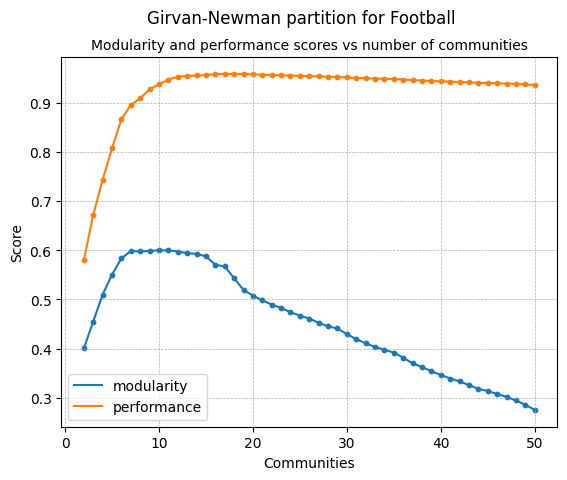

Number of communities of the partition with the max modularity score is: 10
Number of communities of the partition with the max performance score is: 17


In [36]:
partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores = gn_mod_and_performance(football)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('football', 'gn', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: GOT


Girvan Newman, time: : 1274it [00:07, 163.29it/s]                   


max modularity = 0.66812, idx = 6
max performance = 0.96425, idx = 48


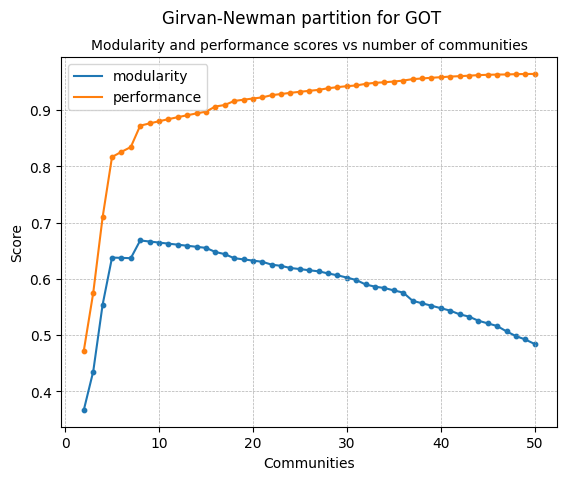

Number of communities of the partition with the max modularity score is: 8
Number of communities of the partition with the max performance score is: 50


In [37]:
partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores = gn_mod_and_performance(got)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('got', 'gn', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: Email-EU no-loops largest component


Girvan Newman, time: : 1274it [22:19,  1.05s/it]                      


max modularity = 0.00062, idx = 0
max performance = 0.13941, idx = 48


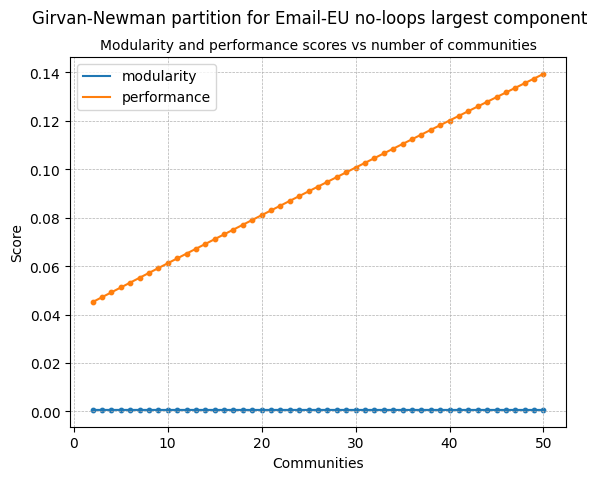

Number of communities of the partition with the max modularity score is: 2
Number of communities of the partition with the max performance score is: 50


In [38]:
partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores = gn_mod_and_performance(eu2)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('eu2', 'gn', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: REG


Girvan Newman, time: : 1274it [00:02, 499.02it/s]                   


max modularity = 0.72500, idx = 6
max performance = 0.96962, idx = 14


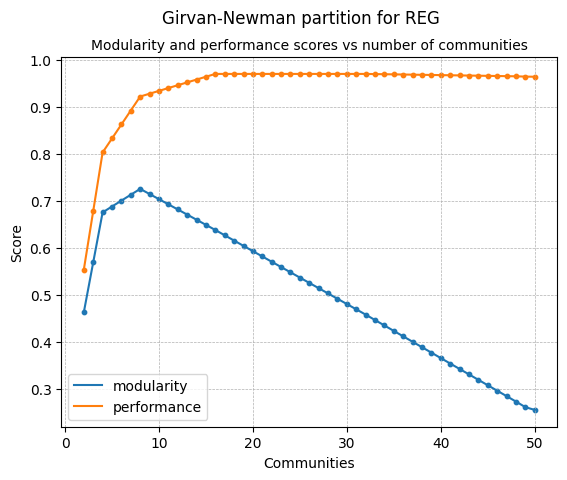

Number of communities of the partition with the max modularity score is: 8
Number of communities of the partition with the max performance score is: 16


In [39]:
partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores = gn_mod_and_performance(REG)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('REG', 'gn', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: RGER


Girvan Newman, time: : 1274it [00:11, 106.96it/s]                   


max modularity = 0.22371, idx = 23
max performance = 0.92215, idx = 31


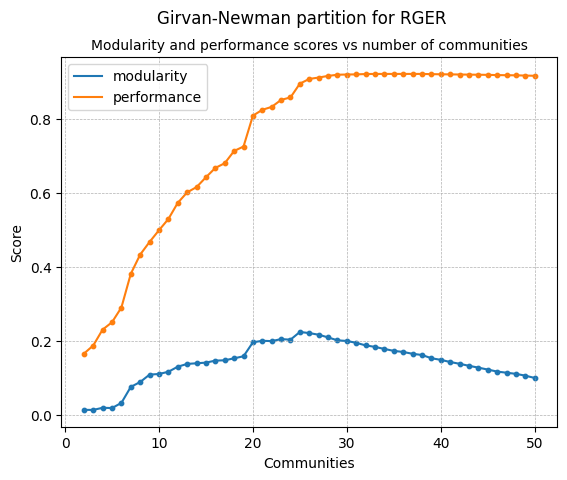

Number of communities of the partition with the max modularity score is: 25
Number of communities of the partition with the max performance score is: 33


In [40]:
partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores = gn_mod_and_performance(RGER)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('RGER', 'gn', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: RGG


Girvan Newman, time: : 1274it [00:17, 71.59it/s]                    


max modularity = 0.48455, idx = 3
max performance = 0.90316, idx = 24


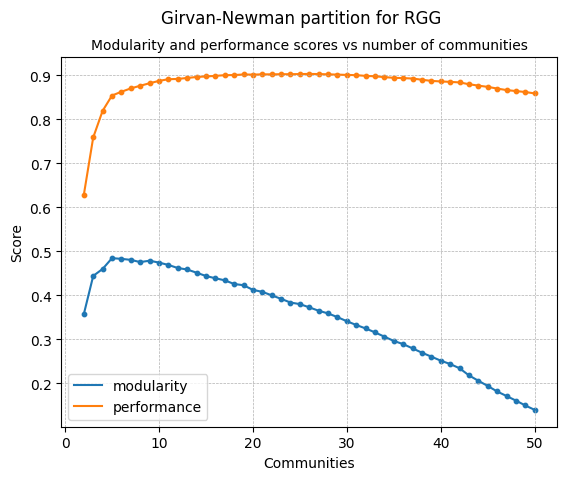

Number of communities of the partition with the max modularity score is: 5
Number of communities of the partition with the max performance score is: 26


In [41]:
partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores = gn_mod_and_performance(RGG)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('RGG', 'gn', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)
partitions_dict = add_partition_result_to_dict('RGG', 'gn', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: SF


Girvan Newman, time: : 1274it [00:10, 121.38it/s]                   


max modularity = 0.13051, idx = 23
max performance = 0.91551, idx = 47


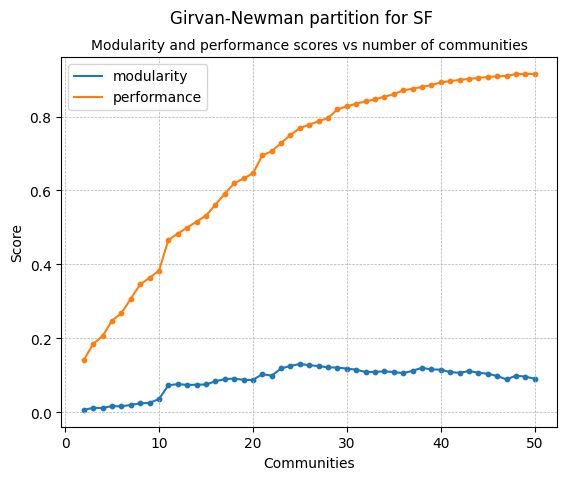

Number of communities of the partition with the max modularity score is: 25
Number of communities of the partition with the max performance score is: 49


In [42]:
partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores = gn_mod_and_performance(SF)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('SF', 'gn', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: SW


Girvan Newman, time: : 1274it [00:03, 419.22it/s]                   


max modularity = 0.57900, idx = 6
max performance = 0.96867, idx = 29


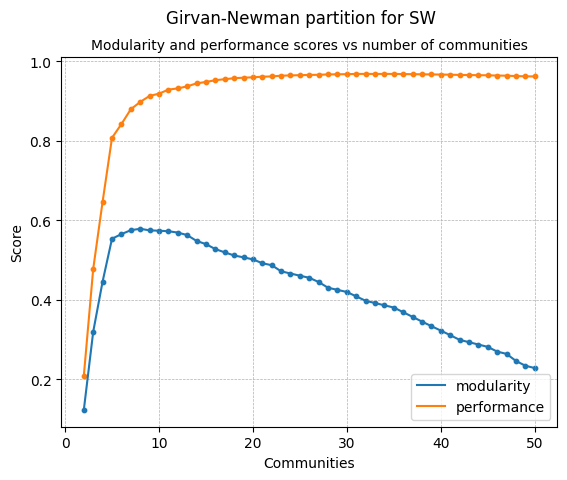

Number of communities of the partition with the max modularity score is: 8
Number of communities of the partition with the max performance score is: 31


In [43]:
partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores = gn_mod_and_performance(SW)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('SW', 'gn', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Spectral Clustering. </h4>
Προσοχή! Για την επιλογή της τιμής της παραμέτρου που αφορά στην διάσταση του projection subspace (n_clusters) της συνάρτησης SpectralClustering, θα πρέπει να λάβετε υπόψη το μέγεθος |V| του εκάστοτε δικτύου.

Να εξετάσετε τις διαμερίσεις που προκύπτουν για n_clusters $=2,3,...,50$. Να επιλέξετε για οπτικοποίηση τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.

In [44]:
from sklearn.cluster import SpectralClustering

def sc_partitions(G: nx.Graph):
    conversion: tuple[nx.Graph, dict]  = conv2int(G) # start value = 0
    G_converted, G_conversion_map = conversion
    adj_matrix: np.array = nx.to_numpy_array(G_converted) # graph adjacency matrix as a NumPy array.

    partitions_list: list[list[set, ...]] = []
    modularity_scores: np.ndarray[float] = np.array([])
    performance_scores: np.ndarray[float] = np.array([])

    # pbar = tqdm(total = 51, desc = f"Spectral Clustering, time: ")
    for n_clusters in tqdm(range(2, 51), desc = f"Spectral Clustering, time: "):

        clustering = SpectralClustering(n_clusters=n_clusters, affinity='precomputed')
        clusters = clustering.fit(adj_matrix)
        cluster_labels = clusters.labels_

        sets_of_communities = [set(np.where(cluster_labels == i)[0]) for i in range(n_clusters)]

        partitions_list.append(sets_of_communities)
        # modularity & performance score of partition of Graph communities
        modularity = community.modularity(G_converted, sets_of_communities)
        performance = community.partition_quality(G_converted, sets_of_communities)[1]
        modularity_scores = np.append(modularity_scores, modularity)
        performance_scores = np.append(performance_scores, performance)
        # pbar.update(communities_found)

    communities_found_list = list(range(2, 51))
    # pbar.close() 
    return partitions_list, communities_found_list, modularity_scores, performance_scores

Graph: Football


Spectral Clustering, time: 100%|██████████| 49/49 [00:20<00:00,  2.35it/s]


max modularity = 0.60220, idx = 9
max performance = 0.95820, idx = 14


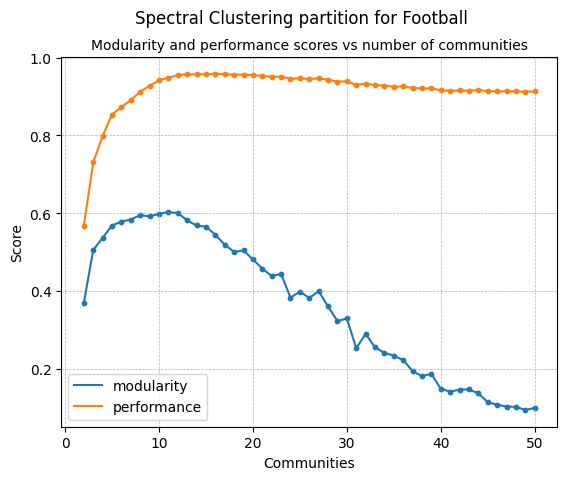

Number of communities of the partition with the max modularity score is: 11
Number of communities of the partition with the max performance score is: 16


In [45]:
partitions_list, communities_found_list, max_mod_idx, modularity_scores, max_perf_idx, performance_scores = gn_mod_and_performance(football, 'Spectral Clustering', sc_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('football', 'sc', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: GOT


Spectral Clustering, time: 100%|██████████| 49/49 [00:16<00:00,  2.99it/s]


max modularity = 0.66542, idx = 5
max performance = 0.94759, idx = 41


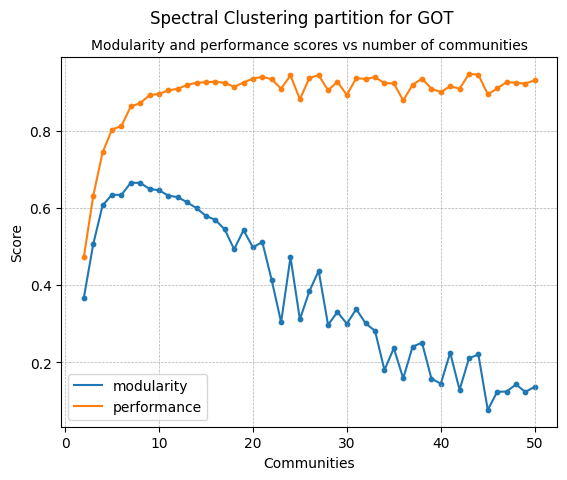

Number of communities of the partition with the max modularity score is: 7
Number of communities of the partition with the max performance score is: 43


In [46]:
partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores = gn_mod_and_performance(got, 'Spectral Clustering', sc_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('got', 'sc', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: Email-EU no-loops largest component


Spectral Clustering, time: 100%|██████████| 49/49 [00:57<00:00,  1.18s/it]


max modularity = 0.36447, idx = 6
max performance = 0.84436, idx = 43


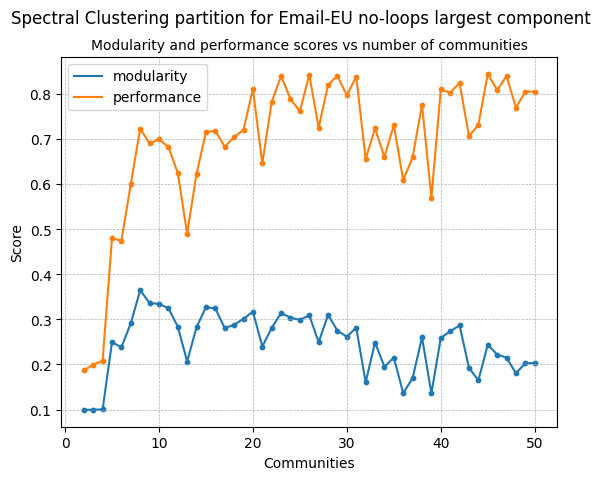

Number of communities of the partition with the max modularity score is: 8
Number of communities of the partition with the max performance score is: 45


In [47]:
partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores = gn_mod_and_performance(eu2, 'Spectral Clustering', sc_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('eu2', 'sc', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: REG


Spectral Clustering, time: 100%|██████████| 49/49 [00:11<00:00,  4.20it/s]


max modularity = 0.72500, idx = 5
max performance = 0.97405, idx = 22


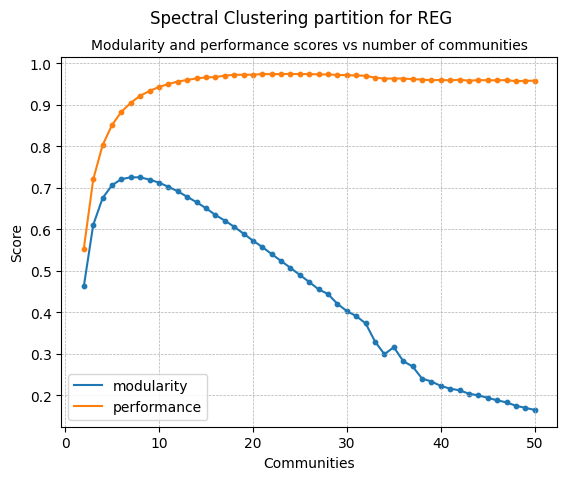

Number of communities of the partition with the max modularity score is: 7
Number of communities of the partition with the max performance score is: 24


In [48]:
partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores = gn_mod_and_performance(REG, 'Spectral Clustering', sc_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('REG', 'sc', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: RGER


Spectral Clustering, time: 100%|██████████| 49/49 [00:11<00:00,  4.11it/s]


max modularity = 0.29178, idx = 7
max performance = 0.91677, idx = 21


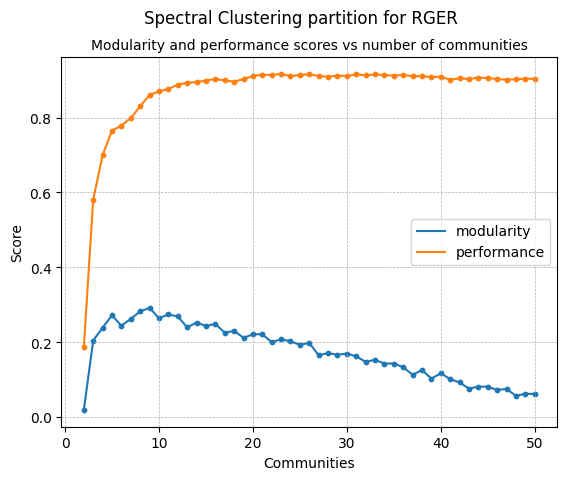

Number of communities of the partition with the max modularity score is: 9
Number of communities of the partition with the max performance score is: 23


In [49]:
partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores = gn_mod_and_performance(RGER, 'Spectral Clustering', sc_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('RGER', 'sc', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: RGG


Spectral Clustering, time: 100%|██████████| 49/49 [00:12<00:00,  4.07it/s]


max modularity = 0.48088, idx = 2
max performance = 0.91108, idx = 8


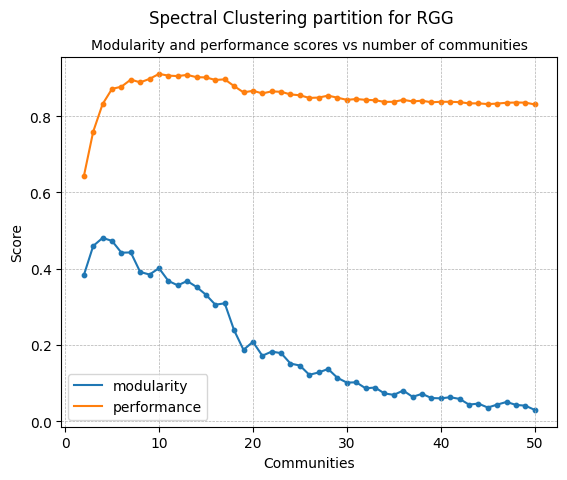

Number of communities of the partition with the max modularity score is: 4
Number of communities of the partition with the max performance score is: 10


In [50]:
partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores = gn_mod_and_performance(RGG, 'Spectral Clustering', sc_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('RGG', 'sc', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: SF


Spectral Clustering, time: 100%|██████████| 49/49 [00:11<00:00,  4.20it/s]


max modularity = 0.24202, idx = 7
max performance = 0.90949, idx = 21


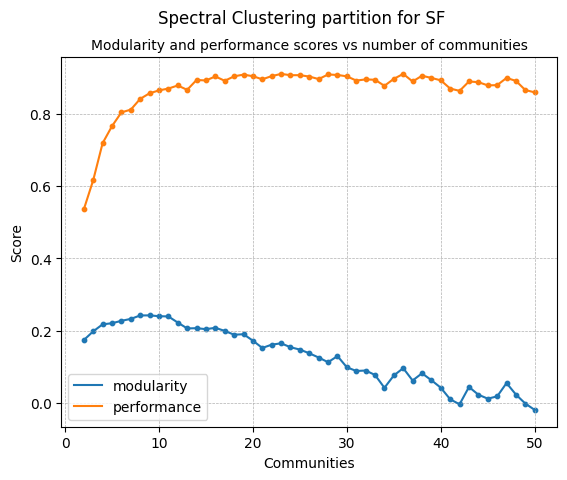

Number of communities of the partition with the max modularity score is: 9
Number of communities of the partition with the max performance score is: 23


In [51]:
partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores = gn_mod_and_performance(SF, 'Spectral Clustering', sc_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('SF', 'sc', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: SW


Spectral Clustering, time: 100%|██████████| 49/49 [00:10<00:00,  4.48it/s]


max modularity = 0.55488, idx = 8
max performance = 0.96867, idx = 27


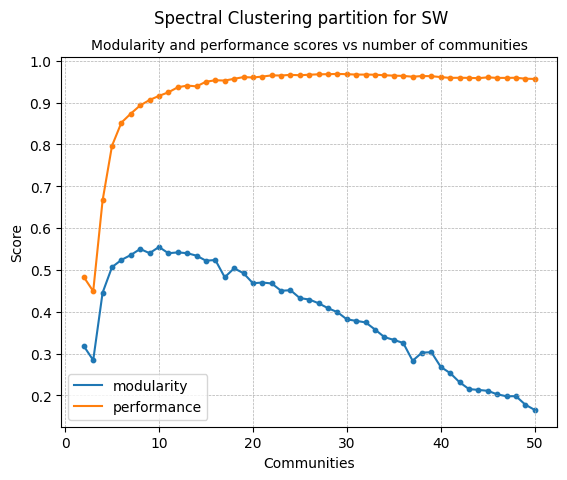

Number of communities of the partition with the max modularity score is: 10
Number of communities of the partition with the max performance score is: 29


In [52]:
partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores = gn_mod_and_performance(SW, 'Spectral Clustering', sc_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('SW', 'sc', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Modularity Maximization.</h4>
Για την διαμέριση που θα προκύψει σε κάθε συνθετικό και πραγματικό δίκτυο, να υπολογίσετε το modularity score και το performance score.

In [58]:
def mm_partitions(G: nx.Graph):
    conversion: tuple[nx.Graph, dict]  = conv2int(G) # start value = 0
    G_converted, G_conversion_map = conversion

    partitions_list: list[list[set, ...]] = []
    modularity_scores: np.ndarray[float] = np.array([])
    performance_scores: np.ndarray[float] = np.array([])

    # pbar = tqdm(total = 51, desc = f"Spectral Clustering, time: ")
    for n_clusters in tqdm(range(2, 51), desc = f"Modularity Maximization, time: "):

        sets_of_communities = community.greedy_modularity_communities(G_converted, cutoff=n_clusters, best_n=n_clusters)

        partitions_list.append(sets_of_communities)
        # modularity & performance score of partition of Graph communities
        modularity = community.modularity(G_converted, sets_of_communities)
        performance = community.partition_quality(G_converted, sets_of_communities)[1]
        modularity_scores = np.append(modularity_scores, modularity)
        performance_scores = np.append(performance_scores, performance)

    communities_found_list = list(range(2, 51))
    return partitions_list, communities_found_list, modularity_scores, performance_scores

Graph: Football


Modularity Maximization, time: 100%|██████████| 49/49 [00:05<00:00,  9.39it/s]


max modularity = 0.54974, idx = 4
max performance = 0.88589, idx = 47


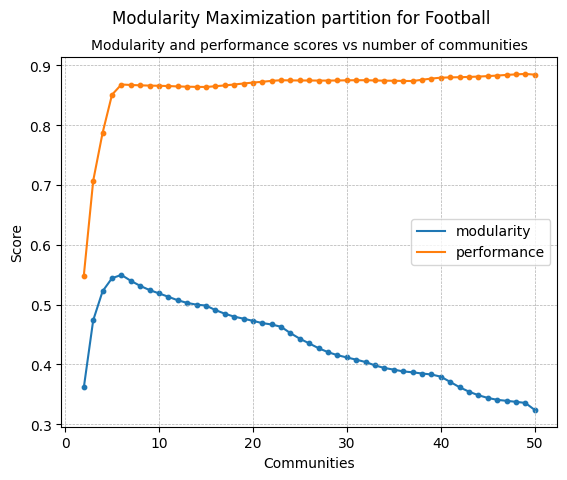

Number of communities of the partition with the max modularity score is: 6
Number of communities of the partition with the max performance score is: 49


In [59]:
partitions_list, communities_found_list, max_mod_idx, modularity_scores, max_perf_idx, performance_scores = gn_mod_and_performance(football, 'Modularity Maximization', mm_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('football', 'mm', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: GOT


Modularity Maximization, time: 100%|██████████| 49/49 [00:04<00:00,  9.95it/s]


max modularity = 0.66048, idx = 3
max performance = 0.90941, idx = 40


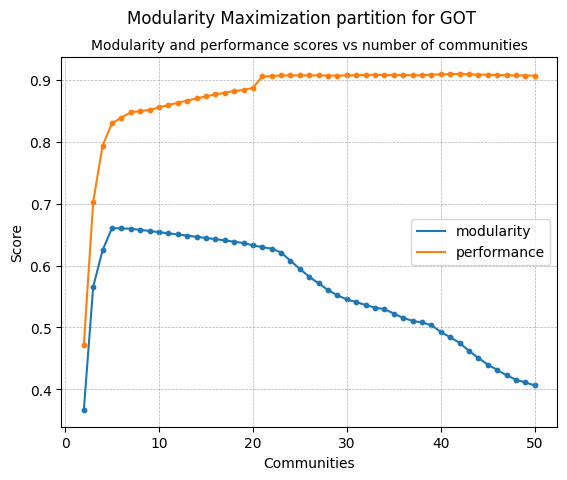

Number of communities of the partition with the max modularity score is: 5
Number of communities of the partition with the max performance score is: 42


In [60]:
partitions_list, communities_found_list, max_mod_idx, modularity_scores, max_perf_idx, performance_scores = gn_mod_and_performance(got, 'Modularity Maximization', mm_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('got', 'mm', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: Email-EU no-loops largest component


Modularity Maximization, time: 100%|██████████| 49/49 [08:35<00:00, 10.53s/it]


max modularity = 0.34713, idx = 6
max performance = 0.73870, idx = 48


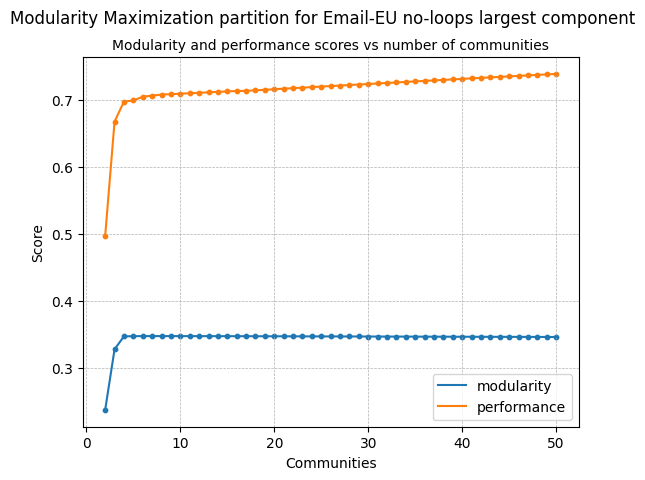

Number of communities of the partition with the max modularity score is: 8
Number of communities of the partition with the max performance score is: 50


In [61]:
partitions_list, communities_found_list, max_mod_idx, modularity_scores, max_perf_idx, performance_scores = gn_mod_and_performance(eu2, 'Modularity Maximization', mm_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('eu2', 'mm', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: REG


Modularity Maximization, time: 100%|██████████| 49/49 [00:00<00:00, 53.14it/s]


max modularity = 0.67312, idx = 2
max performance = 0.90222, idx = 48


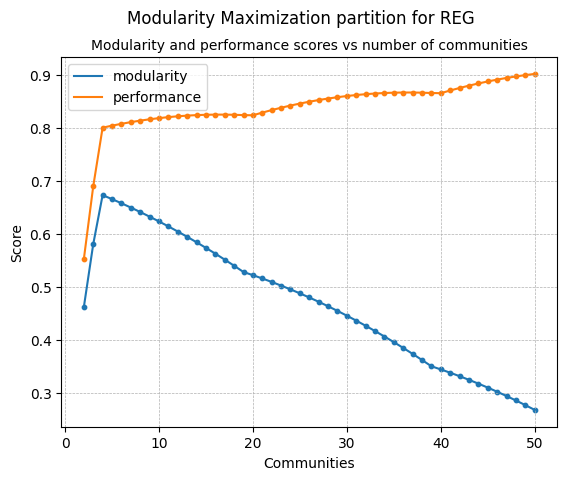

Number of communities of the partition with the max modularity score is: 4
Number of communities of the partition with the max performance score is: 50


In [62]:
partitions_list, communities_found_list, max_mod_idx, modularity_scores, max_perf_idx, performance_scores = gn_mod_and_performance(REG, 'Modularity Maximization', mm_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('REG', 'mm', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: RGER


Modularity Maximization, time: 100%|██████████| 49/49 [00:02<00:00, 21.75it/s]


max modularity = 0.29625, idx = 4
max performance = 0.89873, idx = 42


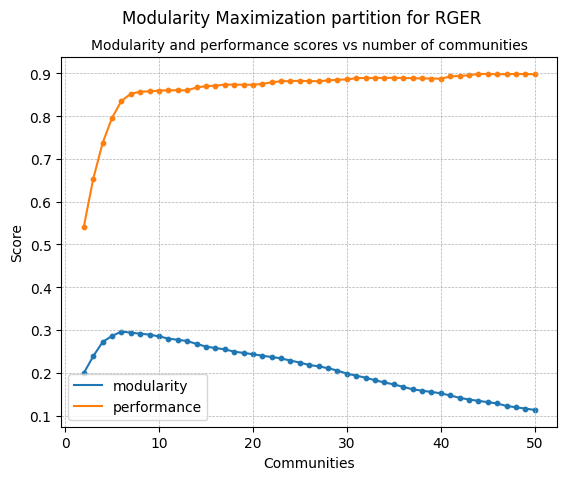

Number of communities of the partition with the max modularity score is: 6
Number of communities of the partition with the max performance score is: 44


In [63]:
partitions_list, communities_found_list, max_mod_idx, modularity_scores, max_perf_idx, performance_scores = gn_mod_and_performance(RGER, 'Modularity Maximization', mm_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('RGER', 'mm', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: RGG


Modularity Maximization, time: 100%|██████████| 49/49 [00:02<00:00, 17.91it/s]


max modularity = 0.43872, idx = 1
max performance = 0.82152, idx = 23


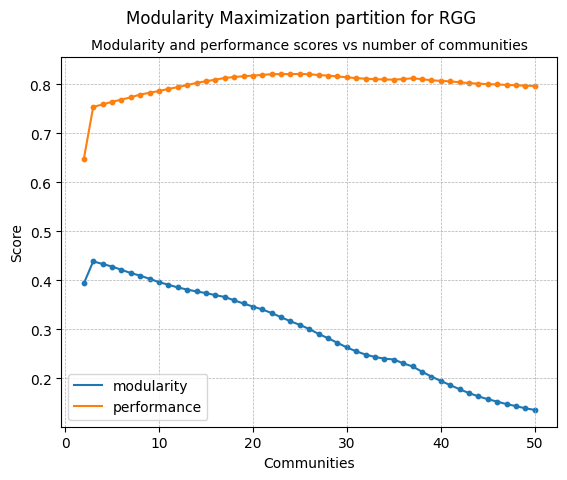

Number of communities of the partition with the max modularity score is: 3
Number of communities of the partition with the max performance score is: 25


In [64]:
partitions_list, communities_found_list, max_mod_idx, modularity_scores, max_perf_idx, performance_scores = gn_mod_and_performance(RGG, 'Modularity Maximization', mm_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('RGG', 'mm', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: SF


Modularity Maximization, time: 100%|██████████| 49/49 [00:01<00:00, 29.54it/s]


max modularity = 0.26313, idx = 5
max performance = 0.90601, idx = 46


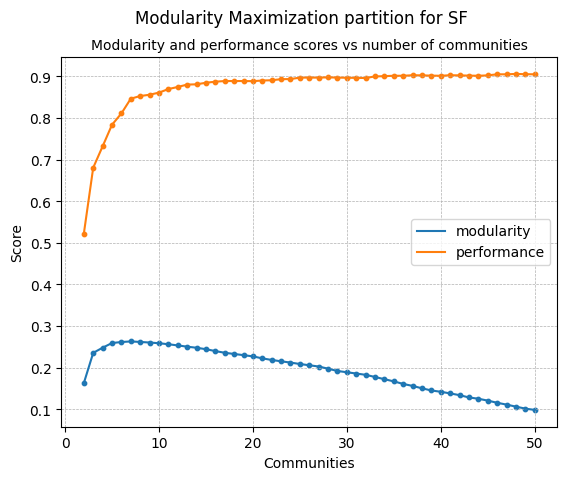

Number of communities of the partition with the max modularity score is: 7
Number of communities of the partition with the max performance score is: 48


In [65]:
partitions_list, communities_found_list, max_mod_idx, modularity_scores, max_perf_idx, performance_scores = gn_mod_and_performance(SF, 'Modularity Maximization', mm_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('SF', 'mm', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

Graph: SW


Modularity Maximization, time: 100%|██████████| 49/49 [00:01<00:00, 48.83it/s]


max modularity = 0.56937, idx = 6
max performance = 0.95918, idx = 40


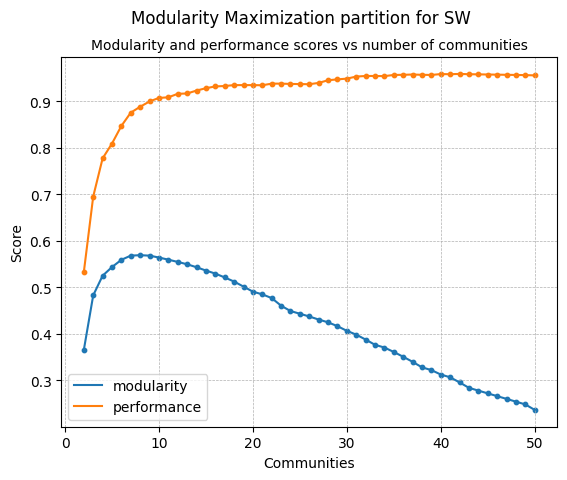

Number of communities of the partition with the max modularity score is: 8
Number of communities of the partition with the max performance score is: 42


In [66]:
partitions_list, communities_found_list, max_mod_idx, modularity_scores, max_perf_idx, performance_scores = gn_mod_and_performance(SW, 'Modularity Maximization', mm_partitions)
print(f'Number of communities of the partition with the max modularity score is: {communities[max_mod_idx]}')
print(f'Number of communities of the partition with the max performance score is: {communities[max_perf_idx]}')
partitions_dict = add_partition_result_to_dict('SW', 'mm', partitions_dict, partitions, communities, max_mod_idx, mod_scores, max_perf_idx, perf_scores)

#### Οπτικοποίηση κοινοτήτων American College Football

In [67]:
def communities_single_plot(G: nx.Graph, partitions_list, max_idx, title=None, ax=None):
    if not ax:
        fig, ax = plt.subplots(figsize=(5,5))

    partition = partitions_list[max_idx]
    conversion: tuple[nx.Graph, dict]  = conv2int(G) # start value = 0
    G_converted, G_conversion_map = conversion

    colors = [-1] * len(G_converted)
    for community_idx, community in enumerate(partition):
        for node in community:
            colors[node] = community_idx

    pos = nx.spring_layout(G, seed=42)
    nx.draw_networkx(G, pos=pos, node_color=colors, with_labels=False, node_size=30, width=0.15, alpha=1.0, ax=ax)
    ax.set_title(title, fontdict={"fontsize": 7})
    # plt.show()

def communities_grid_plot(G: nx.Graph, graph_name, partitions_dict, title=None):
    fig, axs = plt.subplots(2, 3, figsize=(14, 7))

    communities_single_plot(G, partitions_dict[graph_name]['gn']['partitions_list'], partitions_dict[graph_name]['gn']['max_mod_idx'], title='Girvan-Newman best modularity', ax=axs[0, 0])
    communities_single_plot(G, partitions_dict[graph_name]['gn']['partitions_list'], partitions_dict[graph_name]['gn']['max_perf_idx'], title='Girvan-Newman best performance', ax=axs[1, 0])

    communities_single_plot(G, partitions_dict[graph_name]['sc']['partitions_list'], partitions_dict[graph_name]['sc']['max_mod_idx'], title='Spectral Clustering best modularity', ax=axs[0, 1])
    communities_single_plot(G, partitions_dict[graph_name]['sc']['partitions_list'], partitions_dict[graph_name]['sc']['max_perf_idx'], title='Spectral Clustering best performance', ax=axs[1, 1])

    communities_single_plot(G, partitions_dict[graph_name]['mm']['partitions_list'], partitions_dict[graph_name]['mm']['max_mod_idx'], title='Modularity maximization best modularity', ax=axs[0, 2])
    communities_single_plot(G, partitions_dict[graph_name]['mm']['partitions_list'], partitions_dict[graph_name]['mm']['max_perf_idx'], title='Modularity maximization best performance', ax=axs[1, 2])

    plt.show()


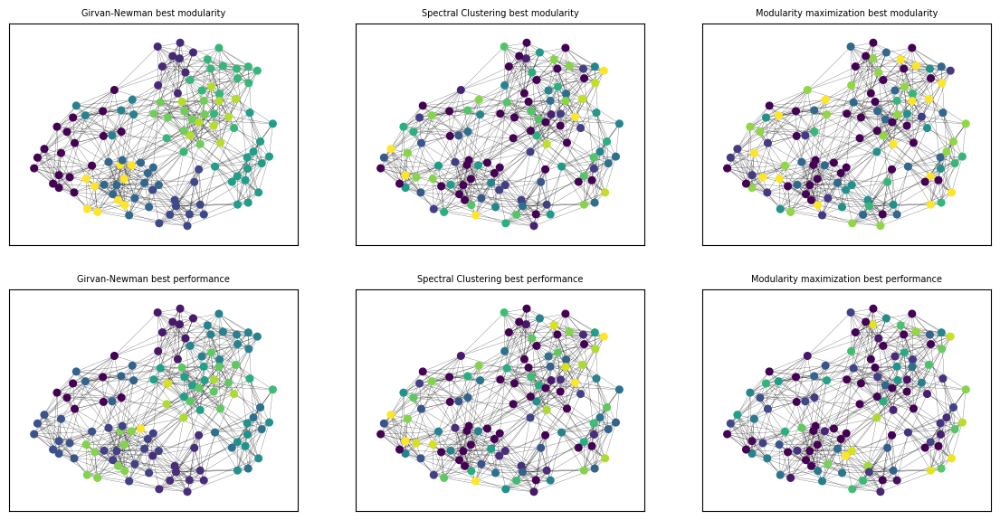

In [68]:
communities_grid_plot(football, 'football', partitions_dict)

#### Οπτικοποίηση κοινοτήτων Game of Thrones

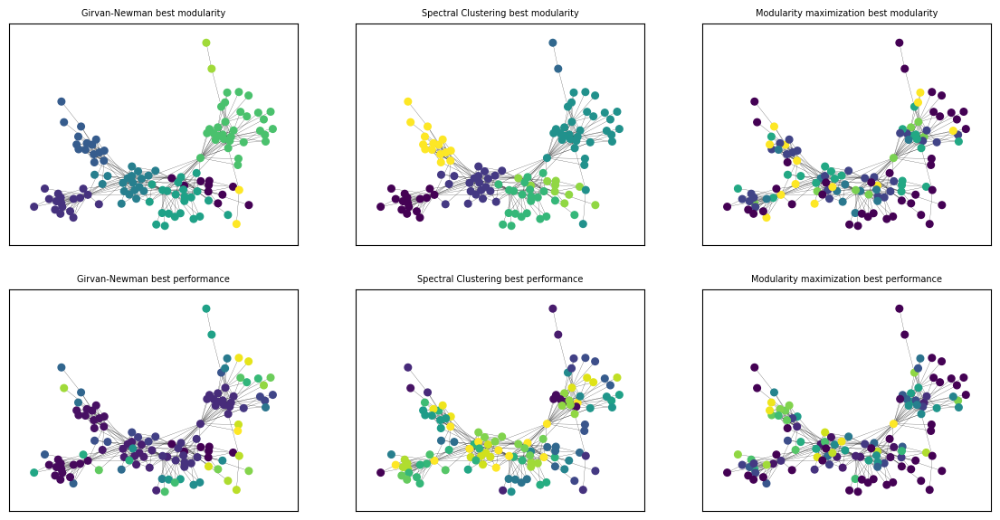

In [82]:
communities_grid_plot(got, 'got', partitions_dict)

#### Οπτικοποίηση κοινοτήτων email-Eu-core (να οπτικοποιηθεί και η ground-truth διαμέριση)

In [194]:
gt_labels =  np.loadtxt('email-Eu-core-department-labels.txt', dtype = np.int64, usecols = 1)
gt_nodes =  np.loadtxt('email-Eu-core-department-labels.txt', dtype = np.int64, usecols = 0)

gt_partitions = [set() for i in set(gt_labels)]

eu2_nodes = [int(node) for node in eu2.nodes]
for node, label in zip(gt_nodes, gt_labels):
    if node in eu2_nodes:
        gt_partitions[label].add(node)  # add current node to appropriate partition set


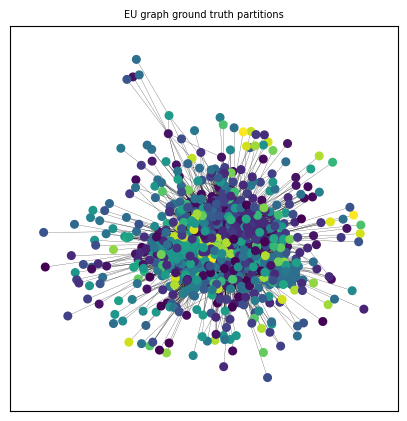

In [195]:
# visualization
fig, ax = plt.subplots(figsize=(5,5))
colors = [-1] * eu2.number_of_nodes()

for community_idx, community in enumerate(gt_partitions):
    for node in community:
        try:
            colors[node] = community_idx
        except:  # case to ignore the nodes that where removed in eu (to form eu2)
            continue 

pos = nx.spring_layout(eu2, seed=42)
nx.draw_networkx(eu2, pos=pos, node_color=colors, with_labels=False, node_size=30, width=0.15, alpha=1.0, ax=ax)
ax.set_title('EU graph ground truth partitions', fontdict={"fontsize": 7})
plt.show()

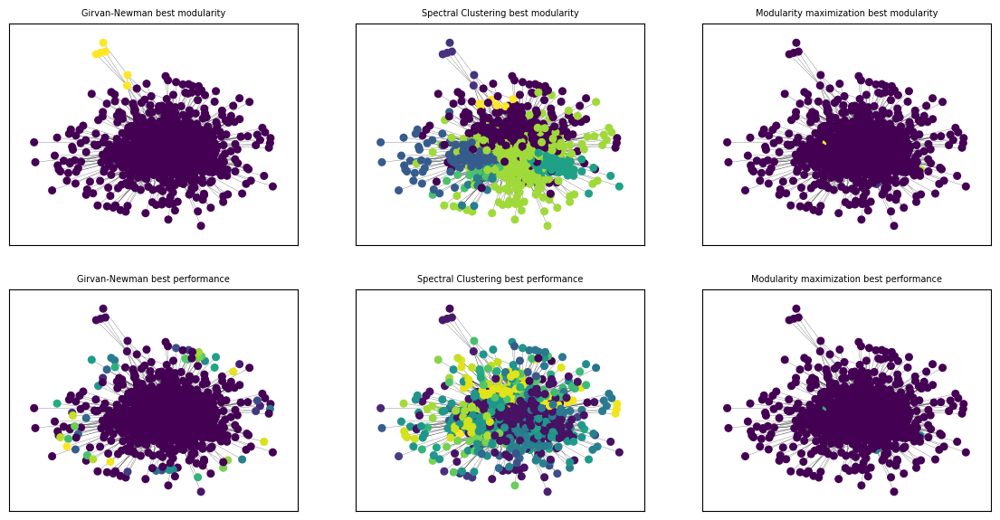

In [83]:
communities_grid_plot(eu2, 'eu2', partitions_dict)

#### Οπτικοποίηση κοινοτήτων REG

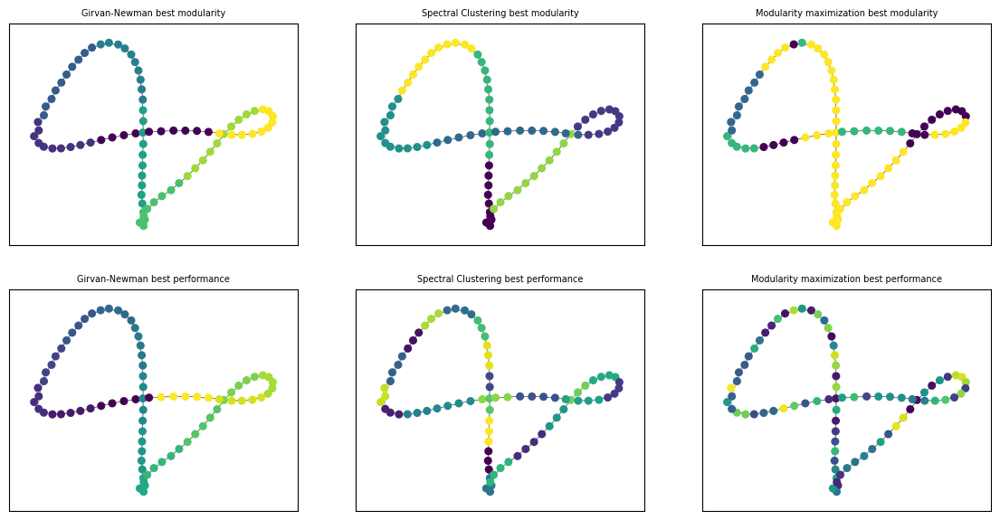

In [85]:
communities_grid_plot(REG, 'REG', partitions_dict)

#### Οπτικοποίηση κοινοτήτων RGER

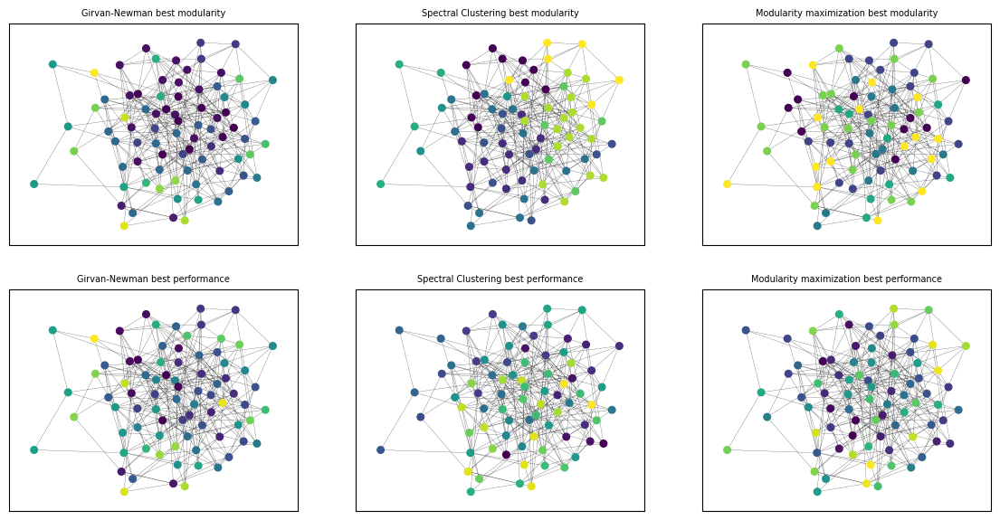

In [86]:
communities_grid_plot(RGER, 'RGER', partitions_dict)

#### Οπτικοποίηση κοινοτήτων RGG

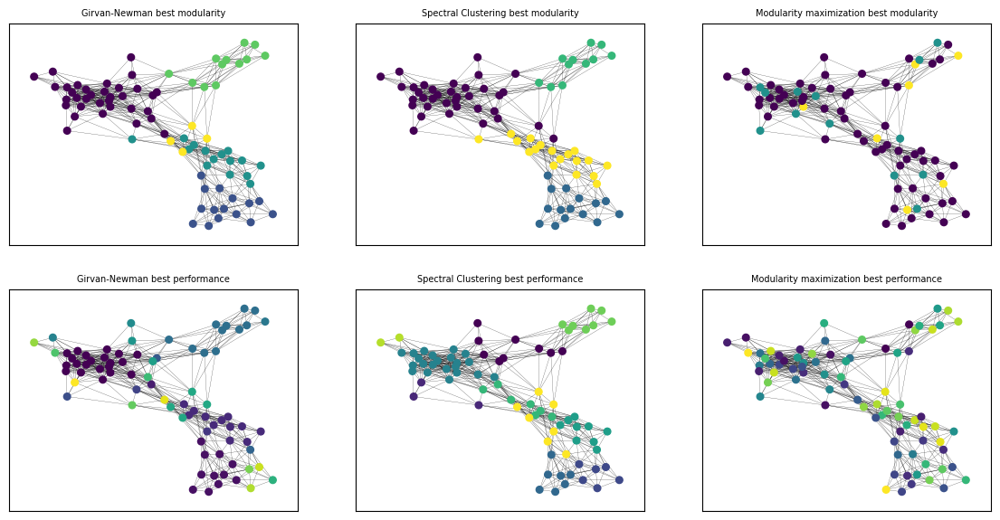

In [87]:
communities_grid_plot(RGG, 'RGG', partitions_dict)

#### Οπτικοποίηση κοινοτήτων SW

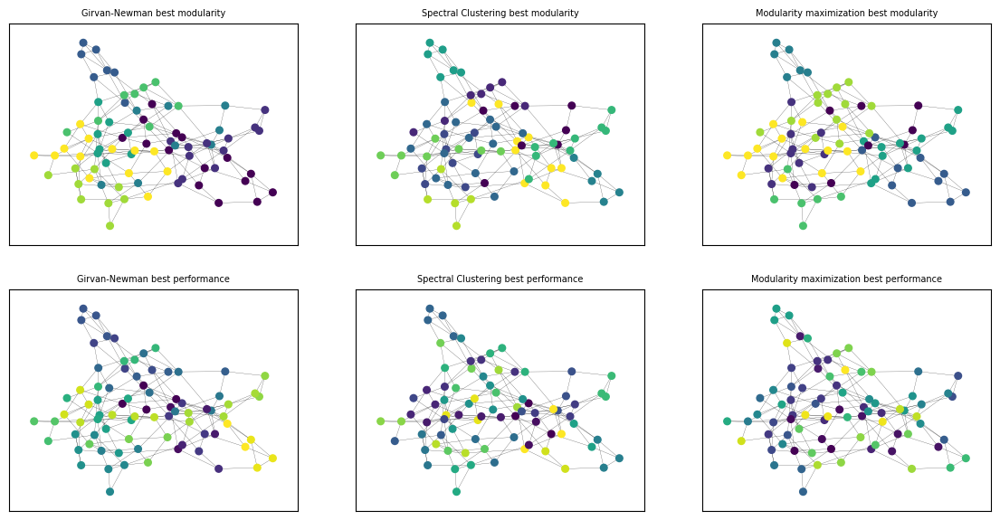

In [88]:
communities_grid_plot(SW, 'SW', partitions_dict)

#### Οπτικοποίηση κοινοτήτων SF

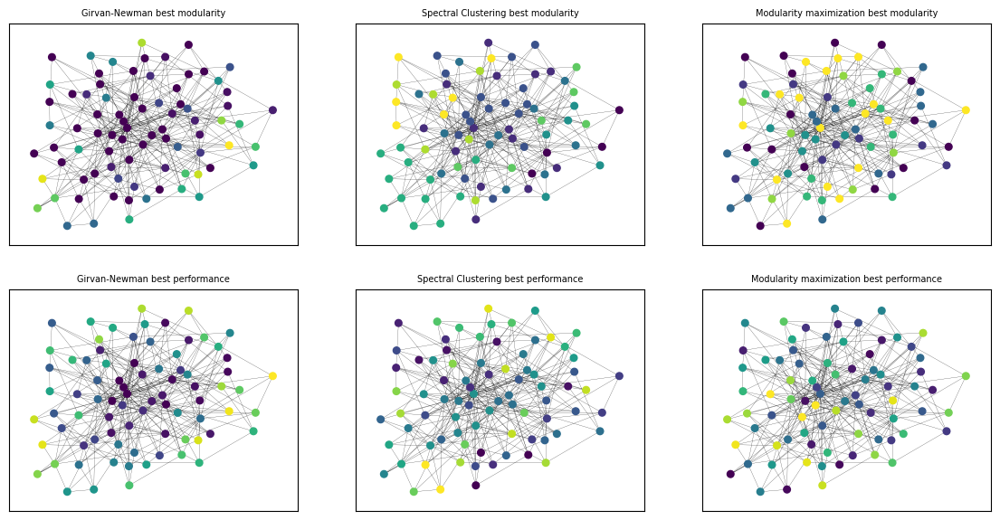

In [89]:
communities_grid_plot(SF, 'SF', partitions_dict)

Comments

From the previous results, we can see that Modularity Maximizations seems to be the faster algorithm in all cases except the largest graph studied, which is the EU graph. For the EU graph, spectral clustering was the fastest method (36 seconds) that also yielded the best maximum performance and modularity metrics. Modularity Maximization took about 5 minutes to run and Girvan Newman more than 10 minutes, yielding a maximum modularity of zero (i.e. partitioning through Girvan Newman was not a successful one)! Also, Girvan Newman seems to be slightly faster than Spectral Clustering in most of the other cases except the large graph (EU graph). 

Overall, Spectral Clustering scored very closely to Modularity Maximization with respect to the max modularity metric and it seems that given the x2 or more runtime boost we get with Modularity Maximization in cases where the graph is not very large, that would be the preferable metric. 

Regarding the maximum performance metric, Girvan Newman seems to be the preferable option given its faster than Spectral Clustering and yields better maximum performance than the Modularity Maximization method. However, it should be avoided for large graphs such as the EU, where it scored very low (0.14).